## Project: Airbnb Price Prediction (New York City Airbnb Open Data)

### Project/Data Brief Information
* Since 2008, guests and hosts have used Airbnb to enhance their travel experiences and offer a more unique, personalized way to experience the world.
* This dataset describes listing activity and performance in New York, NY for 2019.
* This data file includes all the necessary information to learn more about hosts, geographic availability, necessary metrics to make predictions and conclusions.
* We want to see how Airbnb is actually being used and impacting New York City neighborhoods.
* The goal of the project is to conduct a general exploratory analysis of data, build models to predict where it is cheaper to live, and work with signs.
* Dataset taken from open sources. Data citation information below
* Target metric - predicted cost of living in the property (price)

### Data citation information:
- This dataset is public available for research.
- Acknowledgements:
     * This public dataset is part of Airbnb, and the original source can be found on this website - http://insideairbnb.com/
     * The data behind the Inside Airbnb site is sourced from publicly available information from the Airbnb site. 
     * The data has been analyzed, cleansed and aggregated to faciliate public discussion.

## Project structure

### 1. [Exploratory Data Analysis (EDA)](#analysis)
### 2. [Building and training models](#model1)
### 3. [Building and training models - New strategy (Phase 2)](#model2)
### 4. [Results and conclusions](#result)
   

<a id="analysis"></a>
## 1. Exploratory Data Analysis (EDA)

<a id="analysis1"></a>
### 1.1.  Loading and primary data processing

In [1]:
# import the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import geopy
from scipy import stats as st
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils import shuffle
from plot_metric.functions import BinaryClassification
import itertools
from pandas_profiling import ProfileReport
from sklearn.cluster import KMeans
import tensorflow as tensorflow
from keras import metrics
import pickle
import sweetviz as sw
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from catboost import CatBoostRegressor
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_val_score, GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.utils import class_weight
from scipy import stats
from scipy.stats import norm
from scipy import stats
from scipy.stats import norm
from sklearn.metrics import f1_score, make_scorer
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score,\
                            precision_recall_curve, roc_curve, classification_report, confusion_matrix,\
                            mean_squared_error, mean_absolute_error, fbeta_score, make_scorer, r2_score
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [2]:
#!pip install shap

In [3]:
# remove the restriction on the number and width of columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)

In [4]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px  black solid !important;
  color: black !important;
}
</style>

In [5]:
# Load the table from an external drive
file_id = '11e9BP2IH57mfuNRIMRpEo1WP68WCwNOF'
download_link = f'https://drive.google.com/uc?id={file_id}'
df = pd.read_csv(download_link)
df_init= df.copy()

In [6]:
df.iloc[:, 1:].describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [7]:
#df = df.drop(columns=df.iloc[:,32:])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [8]:
df.isnull().sum()

id                                0    
name                              16   
host_id                           0    
host_name                         21   
neighbourhood_group               0    
neighbourhood                     0    
latitude                          0    
longitude                         0    
room_type                         0    
price                             0    
minimum_nights                    0    
number_of_reviews                 0    
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count    0    
availability_365                  0    
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

We can remove some features, because they have no meaning

In [10]:
df = df.drop(['id', 'name', 'host_name', 'last_review'], axis=1)

In [11]:
df.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [12]:
#EDA
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# more EDA
repo=sw.analyze(df)
repo.show_html('output.html', open_browser=True)

                                             |          | [  0%]   00:00 -> (? left)

Report output.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


<a id="analysis2"></a>
### 1.2. EDA: study of distributions of numerical/categorical features, correlation analysis

In [14]:
df.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [15]:
df.columns

Index(['host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [16]:
df.dtypes

host_id                           int64  
neighbourhood_group               object 
neighbourhood                     object 
latitude                          float64
longitude                         float64
room_type                         object 
price                             int64  
minimum_nights                    int64  
number_of_reviews                 int64  
reviews_per_month                 float64
calculated_host_listings_count    int64  
availability_365                  int64  
dtype: object

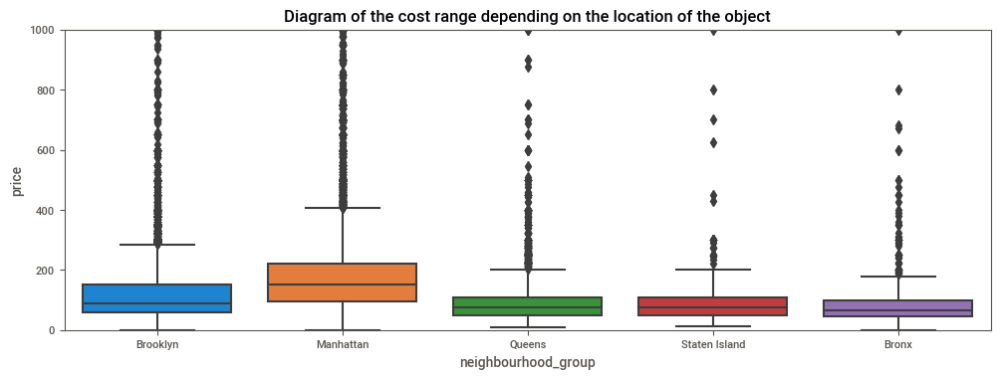

In [17]:
# look at the range diagrams for the target attribute depending on the location (we will limit the upper price limit)
plt.figure(figsize = (12,4))
ax = sns.boxplot(x='neighbourhood_group', y="price", data=df)
plt.title('Diagram of the cost range depending on the location of the object')
ax.set_ylim([0, 1000])
plt.show()

* The boxplot diagram (above) already has a limitation when constructed - data is taken only up to 1000/day.
* As you can see, the target sign fluctuates very much, the range of values is huge - minimum value = 0, maximum - 10000/day
* A huge amount of outliers, but in this case I think that the outliers should be preserved, because they are expensive, exclusive objects.
* Median price - 106/day, average - 153.
* When choosing models, we will take this fact into account and choose models that are resistant to outliers in the data.
* On the other hand, the luxury housing market should probably be analyzed separately
* I also suggest removing null objects (there are 11 in total)

In [18]:
#df.query("price > 8000")
df = df[df.price != 0]
df

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
48890,8232441,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,2,9
48891,6570630,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,2,36
48892,23492952,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,1,27
48893,30985759,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,6,2


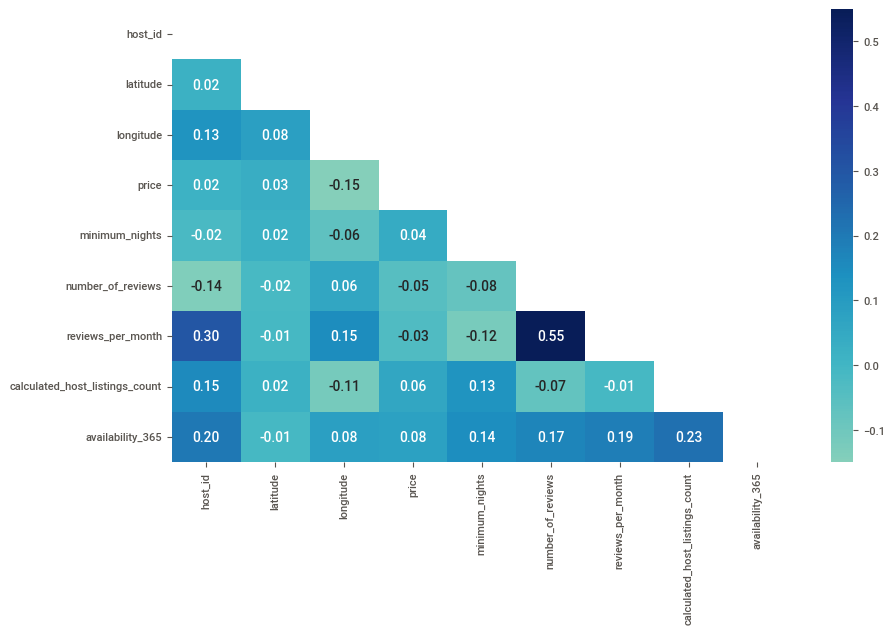

In [19]:
# look at the general correlation matrix (for all features)
plt.figure(figsize=(10,6))
corr_matrix = df.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))
sns.heatmap(lower, annot=True,fmt='.2f', cbar=True, center =0, cmap="YlGnBu", linecolor='white');
#vmin=-0.5, vmax=0.7

In [20]:
# Check the largest correlation (positive and negative)
print(df.corr()['price'].sort_values(ascending=False).head(15))
print('-----------------------------------------------')
print(df.corr()['price'].sort_values(ascending=False).tail())

price                             1.000000
availability_365                  0.081847
calculated_host_listings_count    0.057462
minimum_nights                    0.042805
latitude                          0.033899
host_id                           0.015294
reviews_per_month                -0.030575
number_of_reviews                -0.047926
longitude                        -0.149954
Name: price, dtype: float64
-----------------------------------------------
latitude             0.033899
host_id              0.015294
reviews_per_month   -0.030575
number_of_reviews   -0.047926
longitude           -0.149954
Name: price, dtype: float64


In [21]:
# reviews_per_month fill in the missing values (21%) with the median value
df['reviews_per_month'] = df['reviews_per_month'].fillna(df['reviews_per_month'].median())

<Figure size 1000x1000 with 0 Axes>

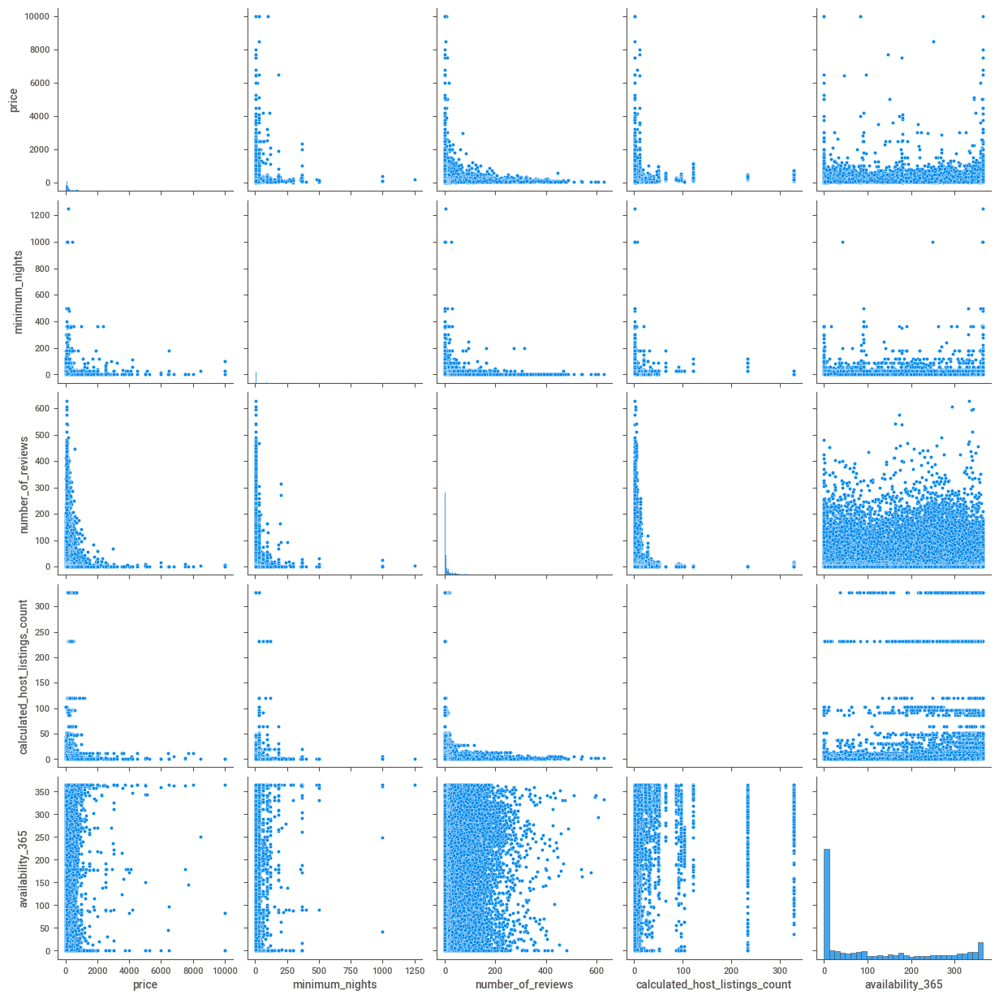

In [22]:
# build a graph of pairwise correlation of features
plt.figure(figsize=(10,10))
sns.pairplot(data=df, vars=('price', 'minimum_nights', 'number_of_reviews',\
                            'calculated_host_listings_count', 'availability_365'),
             height=2.5);

#### Location data (coordinates)
* Coordinate analysis was done separately using the QlikSense BI tool
* Latitude and longitude were combined into one column and a map of the city was built
* I attach this information at the end of this block in the form of a screenshot of a city map with marks of objects
* I don’t see any point in using this data for other purposes.
* For our data set, I think that the coordinates can be safely deleted, because they strongly correlate with the data in the area column (perhaps during modeling I will change my mind and return the coordinates/create a new feature, for example, the distance from the object to the center)

In [23]:
#  QlikSense results
from IPython.display import Image
from IPython.core.display import HTML
#Image(url="https://disk.yandex.com/i/C42f2PAfgzgF1g.png", width=300, height=300)
#Image(url="https://disk.yandex.com/i/U3xzeZ9Rz6gIPg.png", width=300, height=300)
#Image(url="https://disk.yandex.com/i/wjjjrRhlSpC1Ng.png", width=300, height=300)
#Image(url="https://disk.yandex.com/i/UHBpHGhjw0ynnw.png", width=300, height=300);

* The representation includes two layers - density and objects themselves (points)
* For each sample, a range diagram is constructed, and basic boxplot data is also displayed
*Color coding by price

##### QlikSense geo analysis results 1
* All areas
* Type of housing - only complete house/apartment

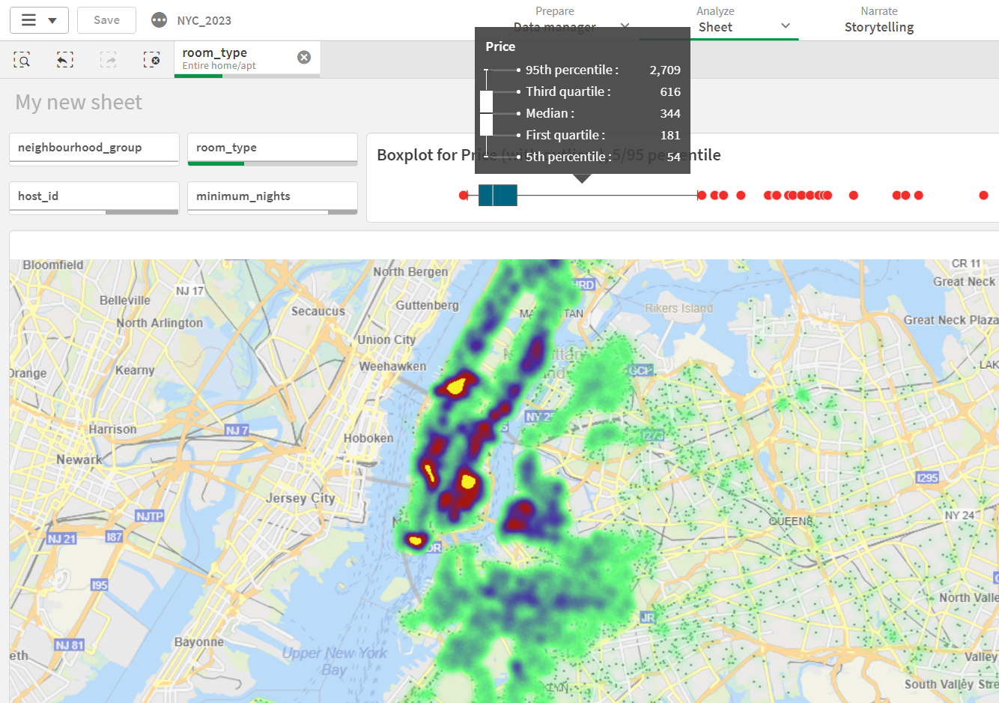

In [24]:
Image(filename="images/1.png")

##### QlikSense geo analysis results 2
* All areas
* Type of housing - rooms only (separate and shared).
* Color coding by price

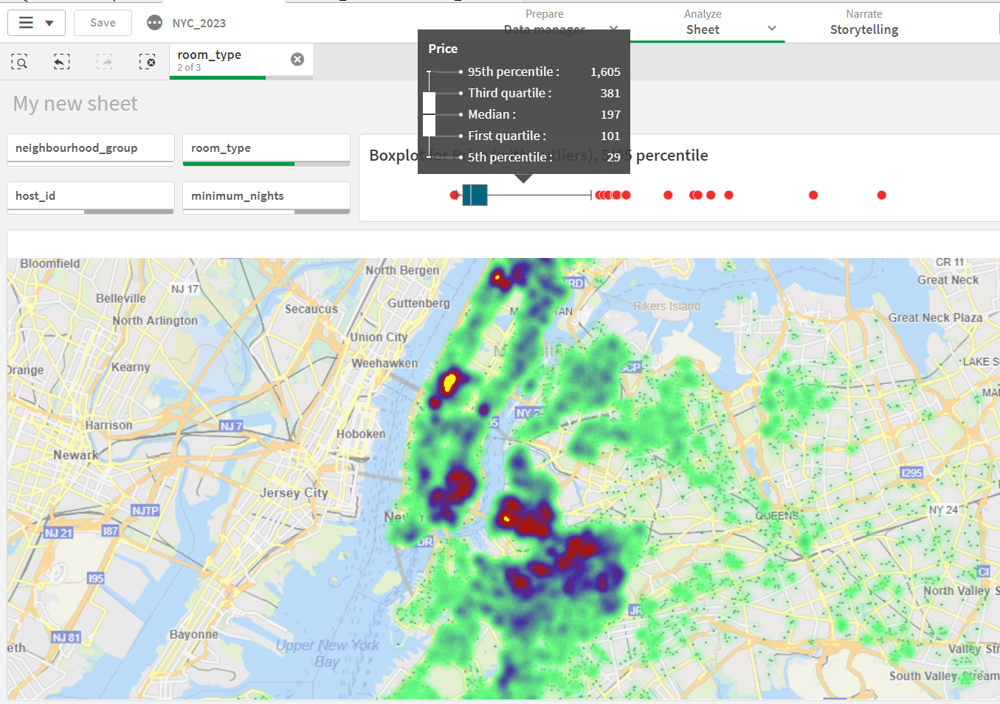

In [25]:
Image(filename="images/2.png")

##### QlikSense geo analysis results 3
* Manhattan area only
* Type of housing - only complete house/apartment
* Color coding by price

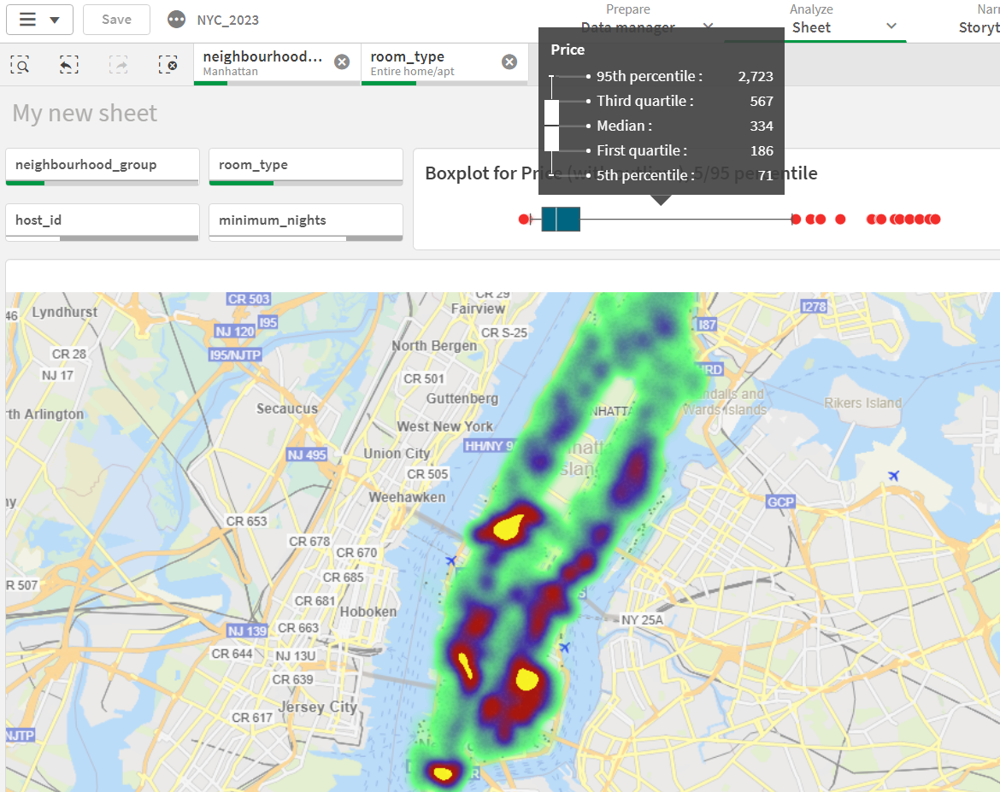

In [26]:
Image(filename="images/3.png")

##### QlikSense geo analysis results 4
* All areas except Manhattan
* Type of housing - all objects except complete house/apartment (i.e. rooms)
* Color coding by price

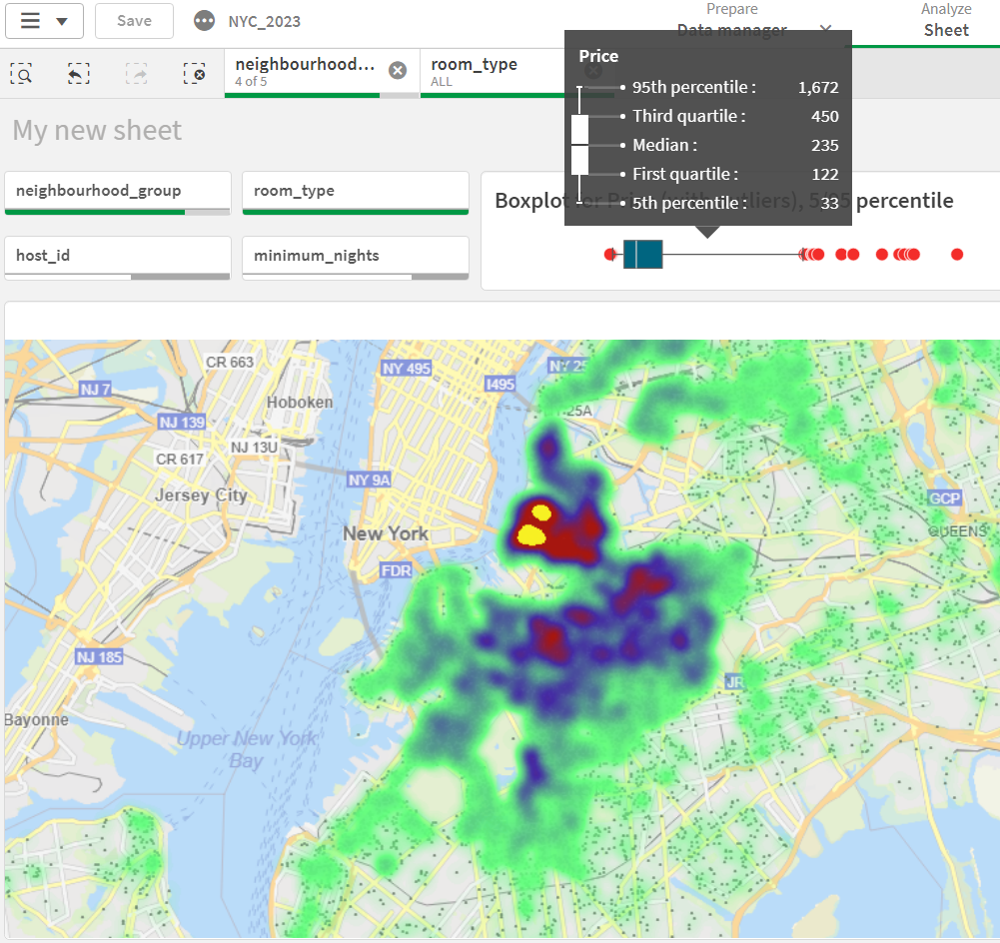

In [27]:
Image(filename="images/4.png")

* Judging by this data, I would do two different datasets and different analyzes in two dimensions:
     - rooms - separate from apartments
     - Manhattan is separate from everything else

In [28]:
# Remove the coordinates for now, because the location is known in the 'neighbourhood'/area
df = df.drop(['host_id', 'latitude', 'longitude'], axis=1)

In [29]:
df

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,Private room,150,3,0,0.72,1,365
3,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0
...,...,...,...,...,...,...,...,...,...
48890,Brooklyn,Bedford-Stuyvesant,Private room,70,2,0,0.72,2,9
48891,Brooklyn,Bushwick,Private room,40,4,0,0.72,2,36
48892,Manhattan,Harlem,Entire home/apt,115,10,0,0.72,1,27
48893,Manhattan,Hell's Kitchen,Shared room,55,1,0,0.72,6,2


To reflect the general distribution of data, we will construct graphs of two types:
* for continuous values we will construct distribution histograms
* for continuous quantities we will also construct a boxplot
* for discrete and binary - countplot
* we apply a breakdown by region and separately by type of object

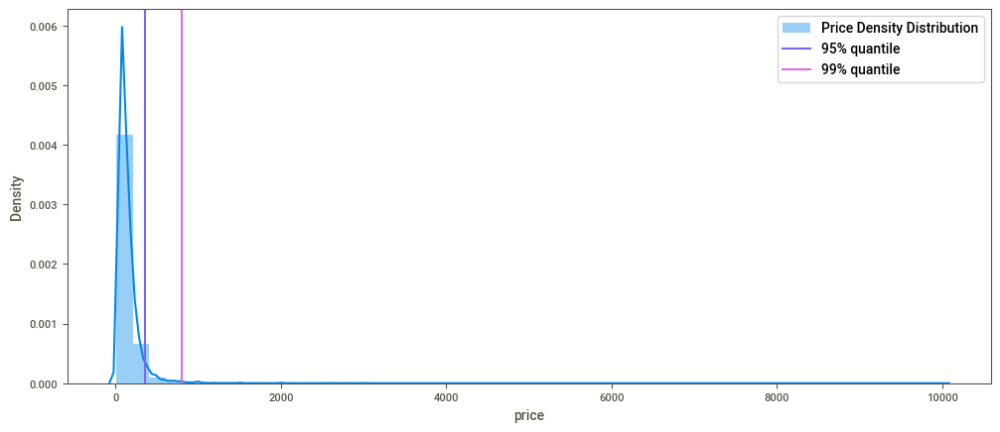

In [30]:
plt.subplots(figsize=(12,5))
sns.distplot(df['price'], label='Price Density Distribution')
plt.axvline(df.price.quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df.price.quantile(0.99), label='99% quantile', c='orchid')
plt.legend()
plt.show()

* Apparently, we will work with emissions.
* More precisely: the dataset needs to be divided into regular prices and for luxury housing, and analyzed/modeled separately.
* I suggest leaving it as it is for now; if the models cannot predict, given the huge number of anomalies, then we will return to their processing.
* We’ll also look at the breakdown by area - whether such anomalies are present everywhere or only in a certain area

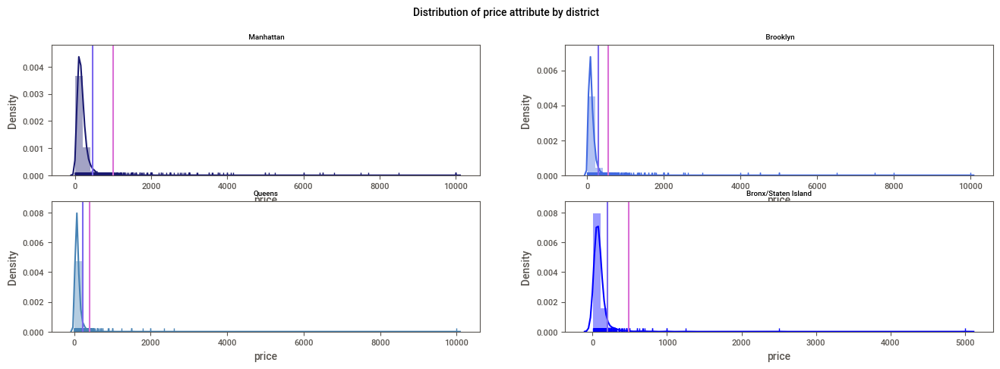

In [31]:
# construct distribution diagrams of the target feature across all areas
plt.figure(figsize=(16,5))
plt.subplot(2,2,1)
plt.suptitle('Distribution of price attribute by district \n', fontsize=10)
plt.title(' \n Manhattan', fontsize=7)
#plt.xlabel('product')
#plt.ylabel('')
sns.distplot(df.query('neighbourhood_group == "Manhattan"')['price'], bins=50, rug=True, color= 'midnightblue')
plt.axvline(df.query('neighbourhood_group == "Manhattan"').price.quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df.query('neighbourhood_group == "Manhattan"').price.quantile(0.99), label='99% quantile', c='orchid')

plt.subplot(2,2,2)
plt.title(' \n Brooklyn', fontsize=7)
#plt.xlabel('product')
#plt.ylabel('')
sns.distplot(df.query('neighbourhood_group == "Brooklyn"')['price'], bins=50,rug=True, color= 'royalblue')
plt.axvline(df.query('neighbourhood_group == "Brooklyn"').price.quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df.query('neighbourhood_group == "Brooklyn"').price.quantile(0.99), label='99% quantile', c='orchid')

plt.subplot(2,2,3)
plt.title('Queens', fontsize=7)
#plt.xlabel(' \n product' + '\n  1')
#plt.ylabel('')
sns.distplot(df.query('neighbourhood_group == "Queens"')['price'], bins=50,rug=True, color= 'steelblue')
plt.axvline(df.query('neighbourhood_group == "Queens"').price.quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df.query('neighbourhood_group == "Queens"').price.quantile(0.99), label='99% quantile', c='orchid')

plt.subplot(2,2,4)
plt.title('Bronx/Staten Island', fontsize=7)
#plt.xlabel(' \n product' + '\n  1')
#plt.ylabel('')
sns.distplot(df.query('neighbourhood_group == "Bronx" or neighbourhood_group == "Staten Island"')['price'], bins=50,rug=True, color= 'blue')
plt.axvline(df.query('neighbourhood_group == "Bronx" or neighbourhood_group == "Staten Island"').price.quantile(0.95), label='95% quantile', c='mediumslateblue')
plt.axvline(df.query('neighbourhood_group == "Bronx" or neighbourhood_group == "Staten Island"').price.quantile(0.99), label='99% quantile', c='orchid')
plt.show()

* Outliers are almost equally presented in all areas and anomalies reach up to 10,000/day, with the exception of the Bronx/Staten Island areas, where the maximum values reach only 5,000.
* This does not fundamentally change the picture, and all the conclusions drawn above are valid
* We continue the analysis based on individual values
* But first, we analyze the outliers/anomalies

In [32]:
def outlier_std(df, col, threshold=3):
    mean = df[col].mean()
    std = df[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([df[col]>up_bound, df[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [33]:
def get_column_outliers(df, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = df.columns

    outliers = pd.Series(data=[False]*len(df), index=df_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(df, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True

    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)

    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))

In [34]:
df.columns

Index(['neighbourhood_group', 'neighbourhood', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [35]:
df_features = df.iloc[:, 3:]

In [36]:
# See anomalies/outliers
comparison_table, std_outliers = get_column_outliers(df_features)
anomalies_report(std_outliers)

Total number of outliers: 3291
Percentage of outliers:   6.73%


In [37]:
# Let's look at the summary result for outliers/anomalous values:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
number_of_reviews,156.925983,-110.382001,1221.0,2.497750
reviews_per_month,5.801202,-3.323525,898.0,1.837002
calculated_host_listings_count,106.013183,-91.723927,680.0,1.391048
price,873.265833,-567.755728,388.0,0.793716
minimum_nights,68.566559,-54.506785,327.0,0.668931
availability_365,507.661312,-282.102315,0.0,0.000000


In [38]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.3)|(lower[column] < -0.3))
]
high_corr

['number_of_reviews']

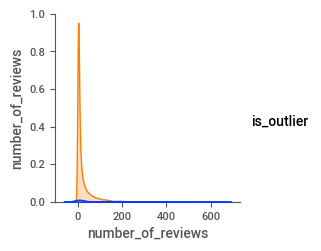

In [39]:
labeled_data = df_features[high_corr].copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');
# Perhaps this feature could be removed

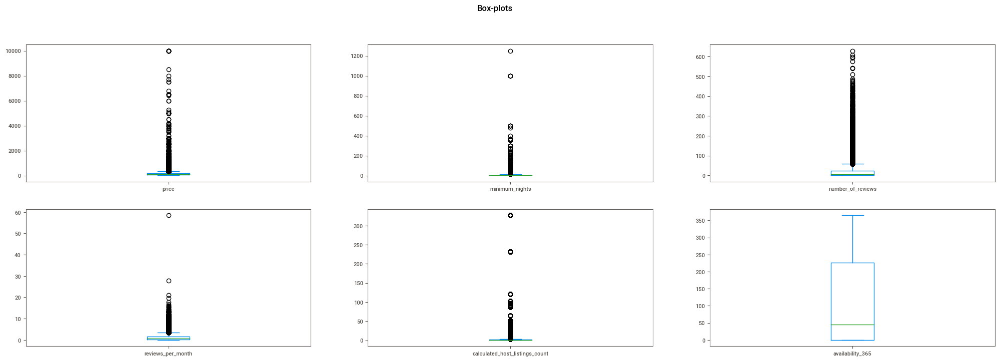

In [40]:
# Let's look at all the features again. Yes, a lot of outliers
fig, axes = plt.subplots(2, 3, figsize=(25, 8))
fig.suptitle('Box-plots')

row=0
col=0

for ax, feature in enumerate(df_features):
    df_features[feature].plot.box(ax=axes[row, col])
    col+=1
    if col > 2:
        row+=1
        col=0

In [41]:
# we look at outliers/abnormal values beyond 1.5 interquartile range (0.25/0.75 quantile)
def outlier_iqr(df, col, threshold=1.5):
    IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
    up_bound = df[col].quantile(0.75) + (IQR * threshold)
    low_bound = df[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([df[col]>up_bound, df[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [42]:
comparison_table, iqr_outliers = get_column_outliers(df_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 12536
Percentage of outliers:   25.64%


In [43]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
minimum_nights,17.00,-11.00,5587.0,11.429097
calculated_host_listings_count,5.00,-2.00,4791.0,9.800753
number_of_reviews,93.00,-68.00,3322.0,6.795680
price,493.00,-249.00,1328.0,2.716635
reviews_per_month,5.48,-3.62,1085.0,2.219540
availability_365,908.00,-681.00,0.0,0.000000


* We analyzed anomalies in the data
* There are many anomalies, once again the conclusion is that analyzing such different market segments (medium and elite) together is not the best way

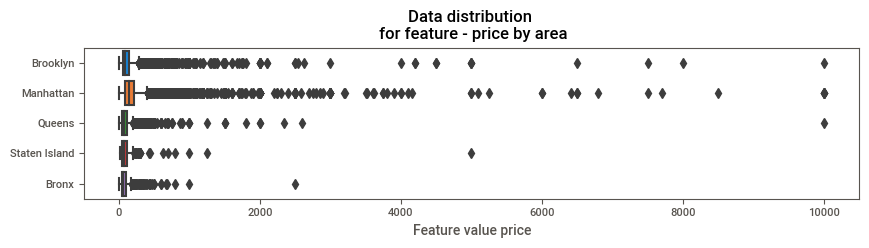

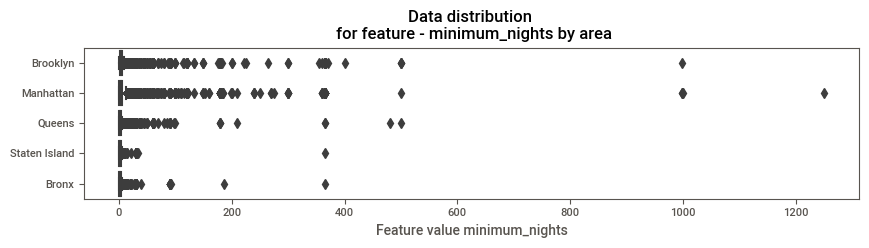

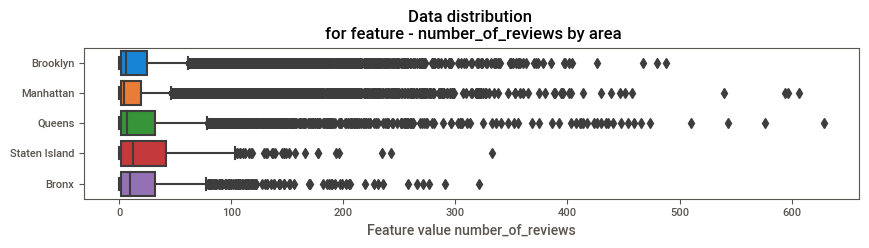

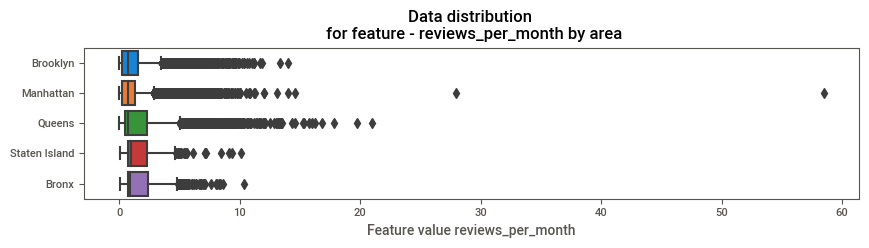

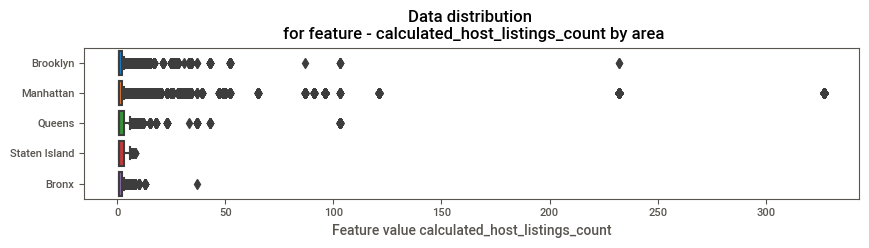

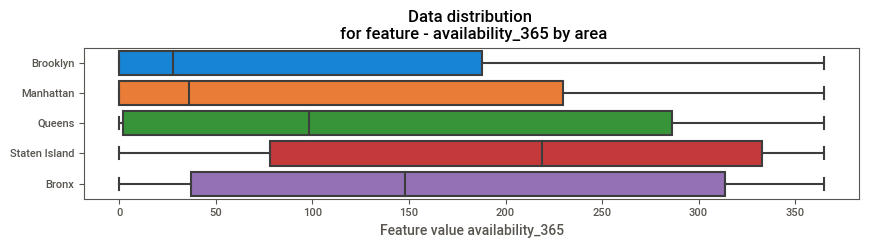

In [44]:
# for continuous values we will construct boxplots (by area)
for column in df.drop(columns = ['neighbourhood_group', 'neighbourhood','room_type']).columns:
    fig,ax = plt.subplots(figsize=(10,2))
    ax=sns.boxplot(df[column], df.neighbourhood_group, ax=ax,  orient='h', saturation=0.8)
    plt.title('Data distribution \n for feature - '+ str(column) + ' by area')
    plt.xlabel('Feature value ' + column)
    plt.ylabel('')
    plt.show()

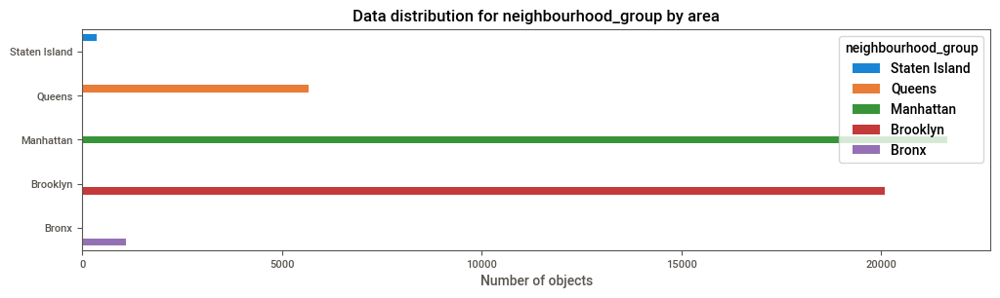

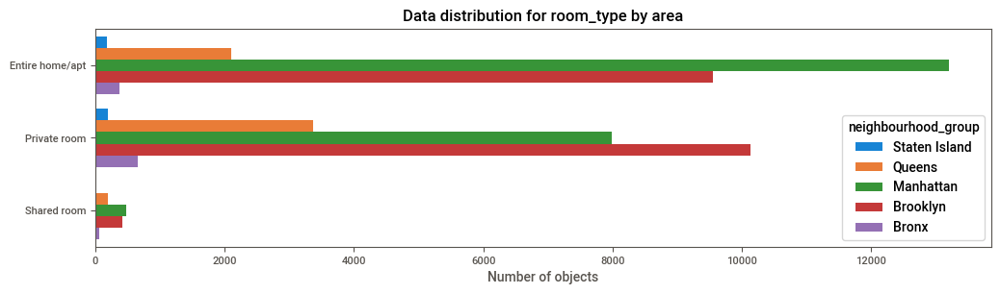

In [45]:
# for discrete and binary features we use countplot (by area)
for column in df.drop(['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                        'calculated_host_listings_count', 'availability_365', 'neighbourhood'],axis=1).columns:
    fig, ax = plt.subplots(figsize=(12,3))
    sns.countplot(y=column, hue='neighbourhood_group', data=df.sort_values(by='neighbourhood_group', ascending=False), ax=ax, saturation=0.8)
    plt.title('Data distribution for '+ str(column) + ' by area')
    plt.xlabel('Number of objects')
    plt.ylabel('')
    plt.show()

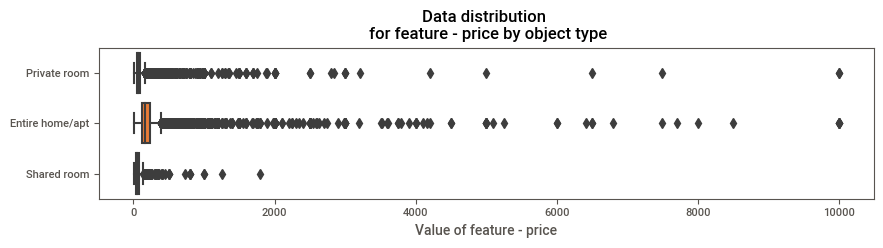

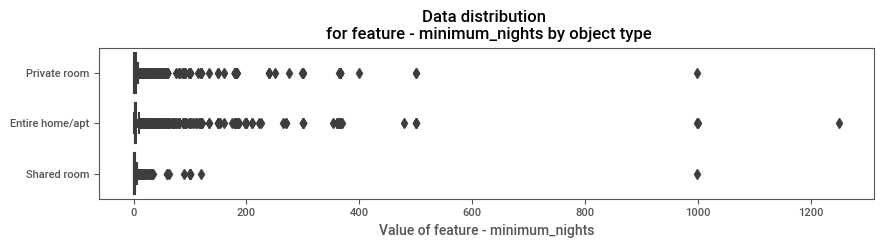

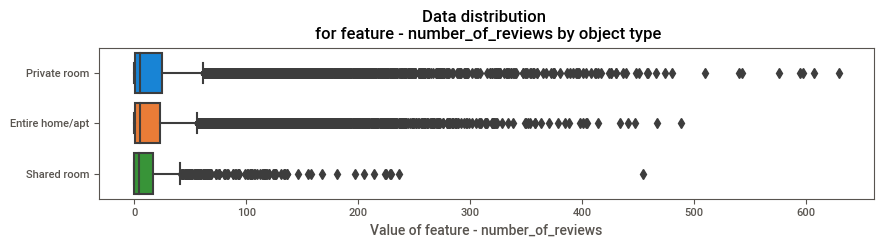

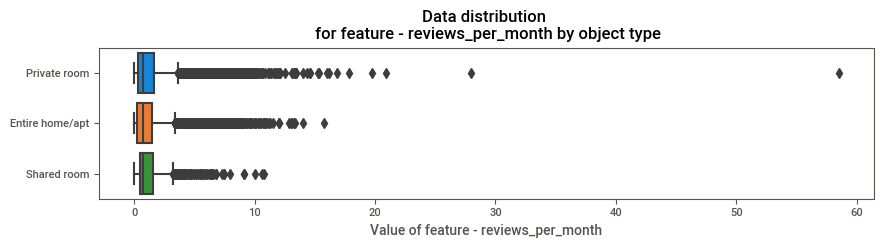

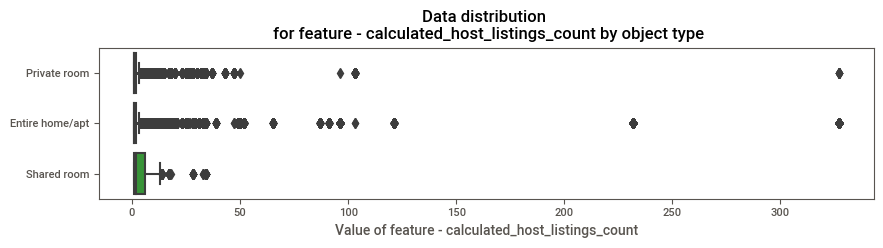

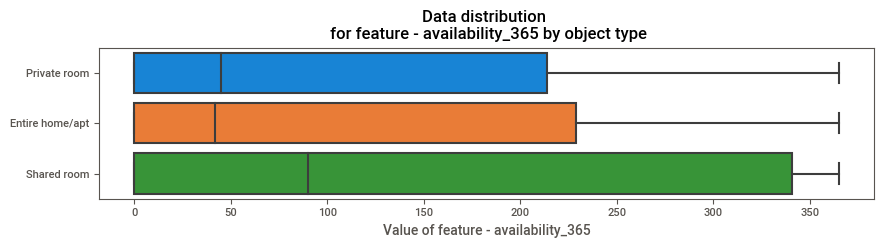

In [46]:
# for continuous features we will construct boxplots (by object types)
for column in df.drop(columns = ['neighbourhood_group', 'neighbourhood', 'room_type']).columns:
    fig,ax = plt.subplots(figsize=(10,2))
    ax=sns.boxplot(df[column], df.room_type, ax=ax,  orient='h', saturation=0.8)
    plt.title('Data distribution \n for feature - '+ str(column) + ' by object type')
    plt.xlabel('Value of feature - ' + column)
    plt.ylabel('')
    plt.show()

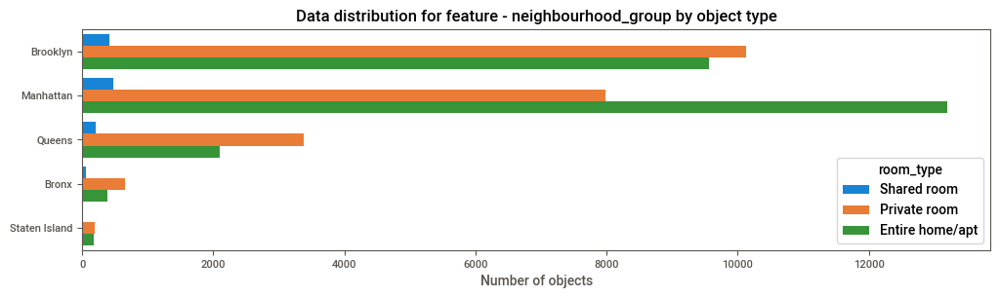

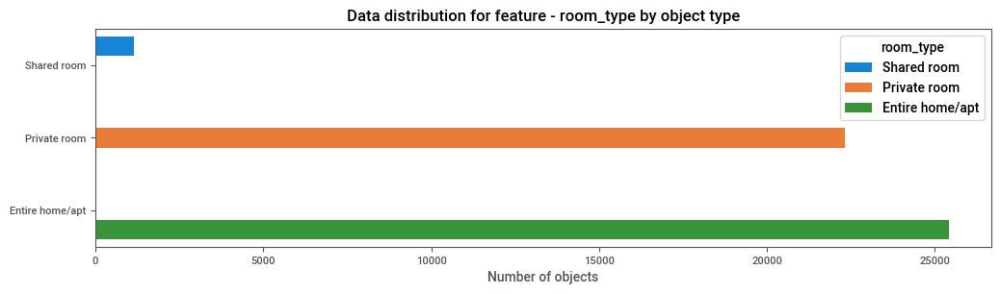

In [47]:
# for discrete and binary features we use countplots (by object types)
for column in df.drop(['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                        'calculated_host_listings_count', 'availability_365', 'neighbourhood'],axis=1).columns:
    fig, ax = plt.subplots(figsize=(12,3))
    sns.countplot(y=column, hue='room_type', data=df.sort_values(by='room_type', ascending=False), ax=ax, saturation=0.8, orient ='h')
    plt.title('Data distribution for feature - '+ str(column) + ' by object type')
    plt.xlabel('Number of objects')
    plt.ylabel('')
    plt.show()

#### OBSERVATIONS:
- We observed the same picture when constructing distribution histograms and range diagrams.
- So, for now we leave it as it is. If the models cannot predict, given the huge number of anomalies, then we will return to their processing (deleting or possibly splitting into two datasets).

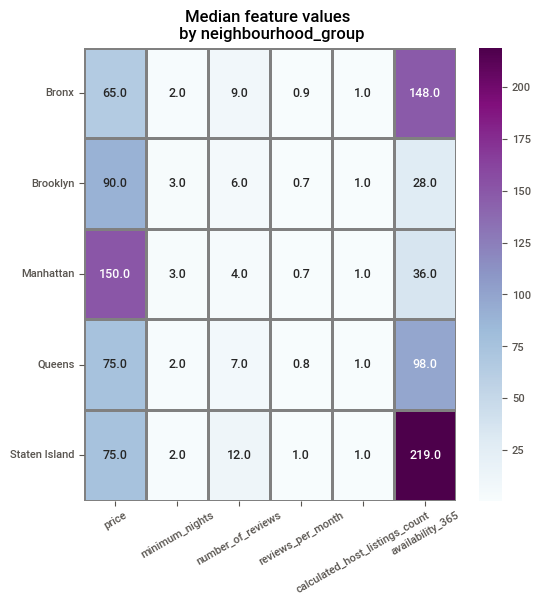

In [48]:
# look at the breakdown by y (price) in the median values by area
plt.figure(figsize = (6,6))
sns.heatmap(data=df.groupby(['neighbourhood_group'])['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                        'calculated_host_listings_count', 'availability_365'].median().round(1), annot = True,
        linewidths=1, linecolor='grey',cmap="BuPu", fmt='.1f', annot_kws={"size": 9})
plt.xticks(rotation=30)
plt.yticks(rotation=0)
plt.title('Median feature values \n by neighbourhood_group')
plt.ylabel('')
plt.xlabel('')
plt.show()

* This matrix just showed/confirmed that luxury housing (Manhattan) stands out from other areas - it is rented shorter term and for a much higher price

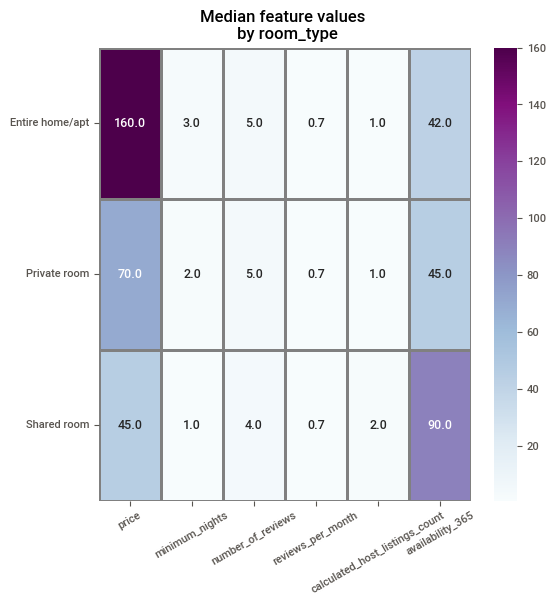

In [49]:
# look at the breakdown by y (price) in the median values by type of housing
plt.figure(figsize = (6,6))
sns.heatmap(data=df.groupby(['room_type'])['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                        'calculated_host_listings_count', 'availability_365'].median().round(1), annot = True,
        linewidths=1, linecolor='grey',cmap="BuPu", fmt='.1f', annot_kws={"size": 9})
plt.xticks(rotation=30)
plt.yticks(rotation=0)
plt.title('Median feature values \n by room_type')
plt.ylabel('')
plt.xlabel('')
plt.show()

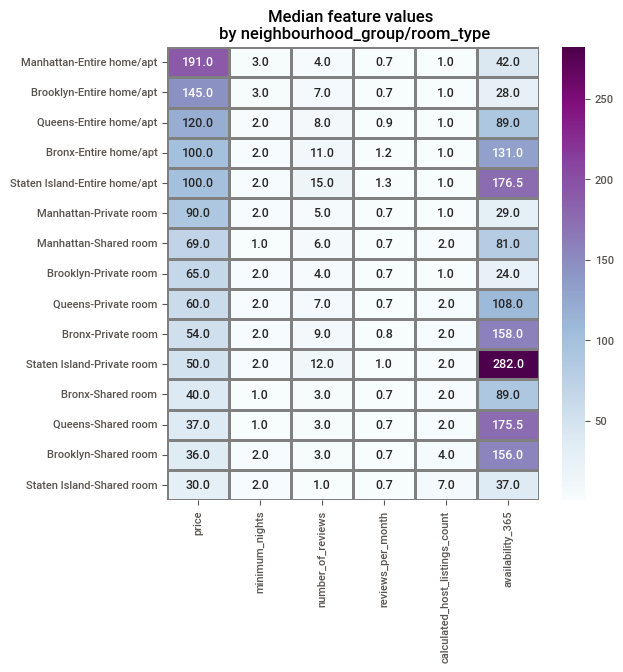

In [50]:
# look at the breakdown by y (price) in the median values by area and type of housing
plt.figure(figsize = (6,6))
sns.heatmap(data=df.groupby(['neighbourhood_group','room_type'])['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                        'calculated_host_listings_count', 'availability_365'].median().round(1).sort_values(by= 'price', ascending = False), annot = True,
        linewidths=1, linecolor='grey',cmap="BuPu", fmt='.1f', annot_kws={"size": 9})
#plt.xticks(rotation=10)
plt.yticks(rotation=0)
plt.title('Median feature values \n by neighbourhood_group/room_type')
plt.ylabel('')
plt.xlabel('')
plt.show()

* All the above conclusions are confirmed
* Ideally, room analysis (for regression models) needs to be done separately

<a id="model1"></a>
## 2. Building and training models

In [51]:
from category_encoders import OrdinalEncoder, OneHotEncoder
#enc = OneHotEncoder()
#enc.fit_transform(df[['neighbourhood_group','neighbourhood','room_type']]).head()
#df_enc = df.drop(['neighbourhood_group','neighbourhood','room_type'], axis = 1).\
    #join(enc.fit_transform(df[['neighbourhood_group','neighbourhood','room_type']], axis = 0))
#df_enc.head()

In [52]:
# Define a function that encodes categorical features using the selected method.
def encode_func(df, enc, cols = ['neighbourhood_group','neighbourhood','room_type']):
    df_enc = df.copy()
    df_enc[cols]= enc.fit_transform(df_enc[cols])
    return df_enc

In [53]:
# After trial and error, I settled on this particular encoder, because it is more suitable for this situation
from category_encoders import CountEncoder
enc = CountEncoder()
df_enc = encode_func(df, enc)
df_enc.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,20095,175,22319,149,1,9,0.21,6,365
1,21660,1545,25407,225,1,45,0.38,2,355
2,21660,2658,22319,150,3,0,0.72,1,365
3,20095,572,25407,89,1,270,4.64,1,194
4,21660,1117,25407,80,10,9,0.10,1,0


In [54]:
df_enc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48884 entries, 0 to 48894
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48884 non-null  int64  
 1   neighbourhood                   48884 non-null  int64  
 2   room_type                       48884 non-null  int64  
 3   price                           48884 non-null  int64  
 4   minimum_nights                  48884 non-null  int64  
 5   number_of_reviews               48884 non-null  int64  
 6   reviews_per_month               48884 non-null  float64
 7   calculated_host_listings_count  48884 non-null  int64  
 8   availability_365                48884 non-null  int64  
dtypes: float64(1), int64(8)
memory usage: 4.7 MB


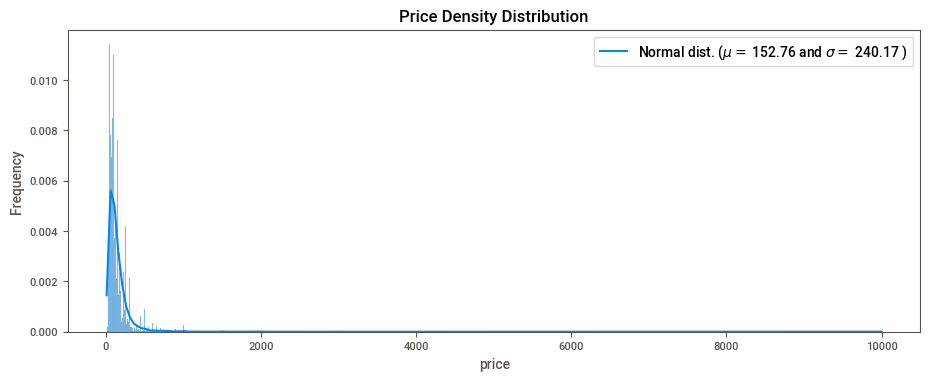

In [55]:
# Check whether the target feature has a normal distribution
plt.figure(figsize=(11,4))
sns.histplot(df_enc["price"], kde=True,stat="density")
(mu, sigma) = norm.fit(df_enc.price)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')
plt.title('Price Density Distribution');

* As we see in the graph above, our distribution is not entirely 'normal distribution', i.e. it is strongly skewed and has a high density on the left
* Let's make a monotonic transformation of the target variable through logarithm (Spoiler - it didn't help)

Text(0.5, 1.0, 'Log of Price Density Distribution')

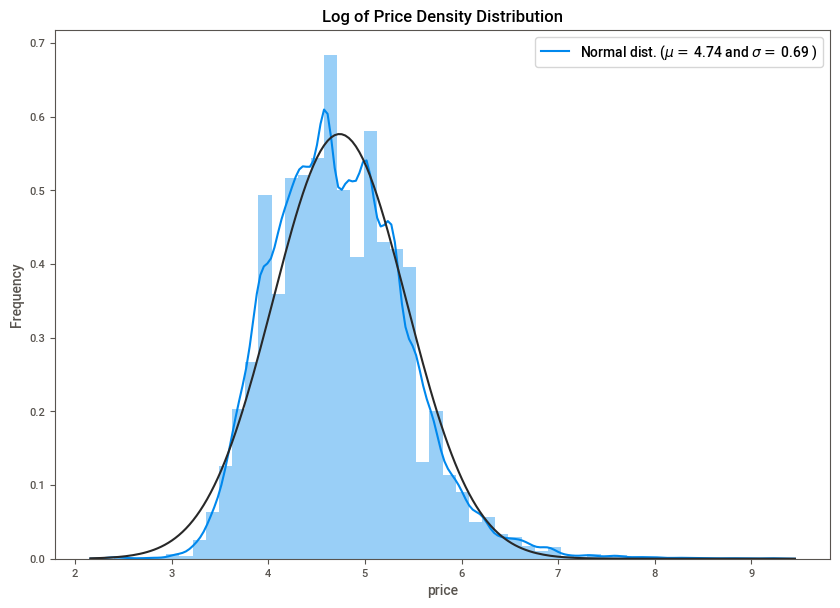

In [56]:
# take the logarithm of the price
df_enc['price'] = np.log1p(df.price)

plt.figure(figsize=(10,7))
sns.distplot(df_enc.price, fit=norm)

# fit the distribution to the logarithm of the price
(mu, sigma) = norm.fit(df_enc.price)

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')
plt.title('Log of Price Density Distribution')

In [57]:
df_enc.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,20095,175,22319,5.010635,1,9,0.21,6,365
1,21660,1545,25407,5.420535,1,45,0.38,2,355
2,21660,2658,22319,5.017280,3,0,0.72,1,365
3,20095,572,25407,4.499810,1,270,4.64,1,194
4,21660,1117,25407,4.394449,10,9,0.10,1,0


In [58]:
df_enc.price.median()

4.672828834461906

In [59]:
X = df_enc.drop('price', axis=1)
y = df_enc['price']

In [60]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42, shuffle=True)

In [61]:
print("X_train shape is",X_train.shape)
print("y_train shape is",y_train.shape)

print("X_test shape is ",X_test.shape)
print("y_test shape is",y_test.shape)

X_train shape is (34218, 8)
y_train shape is (34218,)
X_test shape is  (14666, 8)
y_test shape is (14666,)


In [62]:
#df_enc.columns

In [63]:
#numeric = df.drop(['neighbourhood_group', 'neighbourhood', 'room_type', 'price'], axis=1).columns
#numeric

* Let's carry out standardization, because in this case, all characteristics are on a different scale (some in tenths, some in hundreds of units or even in thousands).
* To avoid the model giving greater significance/weight to larger values, we will standardize and bring everything to the same scale.

In [64]:
#scaler = StandardScaler()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train

array([[1.00000000e+00, 6.43185299e-02, 8.72654542e-01, ...,
        4.32552573e-02, 0.00000000e+00, 1.09589041e-01],
       [1.00000000e+00, 4.99489535e-01, 8.72654542e-01, ...,
        1.19678578e-02, 0.00000000e+00, 2.13698630e-01],
       [1.00000000e+00, 4.58652374e-01, 1.00000000e+00, ...,
        2.73551034e-03, 0.00000000e+00, 0.00000000e+00],
       ...,
       [3.36825292e-02, 2.80755487e-03, 0.00000000e+00, ...,
        2.13711746e-02, 3.06748466e-03, 6.60273973e-01],
       [1.00000000e+00, 5.02807555e-01, 1.00000000e+00, ...,
        2.05163276e-03, 0.00000000e+00, 5.47945205e-03],
       [2.48649410e-01, 1.36804492e-01, 1.00000000e+00, ...,
        3.41938793e-04, 0.00000000e+00, 0.00000000e+00]])

In [65]:
X_test

array([[1.        , 0.28381827, 0.87265454, ..., 0.01333561, 0.00920245,
        0.07945205],
       [1.        , 0.2848392 , 0.87265454, ..., 0.06890067, 0.00920245,
        0.64931507],
       [0.92648095, 1.        , 1.        , ..., 0.00530005, 0.02147239,
        0.26575342],
       ...,
       [0.92648095, 0.6281266 , 1.        , ..., 0.06924261, 0.        ,
        0.62191781],
       [1.        , 0.49948954, 0.        , ..., 0.04547786, 0.01226994,
        0.13150685],
       [0.92648095, 0.01990812, 0.87265454, ..., 0.00153872, 0.        ,
        0.        ]])

### Regression models - selection of parameters and quality assessment

In [66]:
MSE_neg = make_scorer(mean_squared_error, greater_is_better=False)
MAE = make_scorer(mean_absolute_error)
R2 = make_scorer(r2_score)
#RMSE = make_scorer(mean_squared_error)

#### Building and training the DummyRegressor model

In [67]:
# Check the forecast of the model built using DummyClassifier
from sklearn.dummy import DummyRegressor
model_dr = DummyRegressor()
#strategy='median'
model_dr.fit(X_train, y_train)
y_train_pred_dr = model_dr.predict(X_train)
predictions_test_dr = model_dr.predict(X_test)
rmse_dr_test = np.sqrt(mean_squared_error(y_test, predictions_test_dr))
print("Test MSE DummyRegressor = %.2f" % mean_squared_error(y_test, predictions_test_dr))
print("Train MSE DummyRegressor = %.2f" % mean_squared_error(y_train, y_train_pred_dr))
print('Test RMSE DummyRegressor: {:.2f}'.format(rmse_dr_test))
print('Test R2 DummyRegressor: {:.2f}'.format(r2_score(y_test,predictions_test_dr)))

Test MSE DummyRegressor = 0.47
Train MSE DummyRegressor = 0.48
Test RMSE DummyRegressor: 0.69
Test R2 DummyRegressor: -0.00


In [68]:
#  Create a new small dataframe with the final results (main metrics)
columns = ['MSE', 'RMSE', 'R2']
models = ['DummyRegressor', 'CatBoostRegressor', 'LinearRegression', 'RidgeRegression',
          'LassoRegression', 'ElasticNet Regression', 'LGBMRegressor']
result = pd.DataFrame(columns=columns, index = models)
result

,MSE,RMSE,R2
DummyRegressor,NaN,NaN,NaN
CatBoostRegressor,NaN,NaN,NaN
LinearRegression,NaN,NaN,NaN
RidgeRegression,NaN,NaN,NaN
LassoRegression,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN
LGBMRegressor,NaN,NaN,NaN


In [69]:
result.loc['DummyRegressor','MSE'] = mean_squared_error(y_test, predictions_test_dr).round(2)
result.loc['DummyRegressor','RMSE'] = rmse_dr_test.round(2)
result.loc['DummyRegressor','R2'] = r2_score(y_test,predictions_test_dr).round(2)

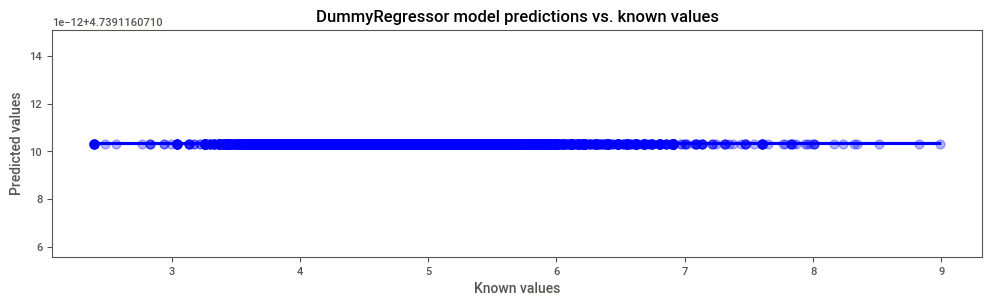

In [70]:
# Visualizing the model's prediction quality
plt.figure(figsize=(12,3))
sns.regplot(y_test, predictions_test_dr, color= 'b', fit_reg=True, scatter_kws={"s": 40, 'alpha':0.3})
plt.title('DummyRegressor model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

#### Building and training the CatBoostRegressor model

In [71]:
# let's find the best hyperparameters for the model CatBoostRegressor 

#cat_features=['neighbourhood_group', 'neighbourhood', 'room_type']
#model_cb = CatBoostRegressor(#one_hot_max_size=5,
#                             random_seed=42, verbose =100, loss_function= "RMSE"
#                             )
#parameters = {'depth'         : [8,10,15,20],
#              'learning_rate' : [0.01, 0.05, 0.1],
#              'iterations'    : [50,100,150]
#             }
#grid = GridSearchCV(estimator=model_cb, param_grid = parameters, cv = 5,\
#                     n_jobs=-1, verbose=True)
#grid.fit(X_train, y_train)
#print(" Results from Grid Search " )
#print(score)
#print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
#print("\n The best score across ALL searched params:\n", grid.best_score_)
#print("\n The best parameters across ALL searched params:\n", grid.best_params_)

In [72]:
%%time
# Use the best found parameters for model training
model_cb = CatBoostRegressor(verbose=50, random_seed=42, iterations= 200,\
                             learning_rate = 0.1, depth=10, loss_function='RMSE')
model_cb.fit(X_train,y_train, eval_set=(X_test,y_test),\
              use_best_model=True, plot=True)
print(model_cb.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6605817	test: 0.6542044	best: 0.6542044 (0)	total: 152ms	remaining: 30.3s
50:	learn: 0.4422904	test: 0.4539294	best: 0.4539294 (50)	total: 921ms	remaining: 2.69s
100:	learn: 0.4275994	test: 0.4454032	best: 0.4454032 (100)	total: 1.73s	remaining: 1.69s
150:	learn: 0.4139754	test: 0.4395940	best: 0.4395940 (150)	total: 2.5s	remaining: 811ms
199:	learn: 0.4041236	test: 0.4370268	best: 0.4370268 (199)	total: 3.25s	remaining: 0us

bestTest = 0.4370267605
bestIteration = 199

{'learn': {'RMSE': 0.404123640185224}, 'validation': {'RMSE': 0.43702676049981554}}
CPU times: total: 1.31 s
Wall time: 3.39 s


In [73]:
y_train_pred_cb = model_cb.predict(X_train)
predictions_test_cb = model_cb.predict(X_test)
rmse_cb_test = np.sqrt(mean_squared_error(y_test, predictions_test_cb))
print("Test MSE CatBoostRegressor = %.2f" % mean_squared_error(y_test, predictions_test_cb))
print("Train MSE CatBoostRegressor = %.2f" % mean_squared_error(y_train, y_train_pred_cb))
print("Test RMSE CatBoostRegressor: {:.2f}".format(rmse_cb_test))
print("Test R2 score: {:.2f}".format(r2_score(y_test,predictions_test_cb)))
result.loc['CatBoostRegressor','MSE'] = mean_squared_error(y_test, predictions_test_cb).round(2)
result.loc['CatBoostRegressor','RMSE'] = rmse_cb_test.round(2)
result.loc['CatBoostRegressor','R2'] = r2_score(y_test,predictions_test_cb).round(2)

Test MSE CatBoostRegressor = 0.19
Train MSE CatBoostRegressor = 0.16
Test RMSE CatBoostRegressor: 0.44
Test R2 score: 0.60


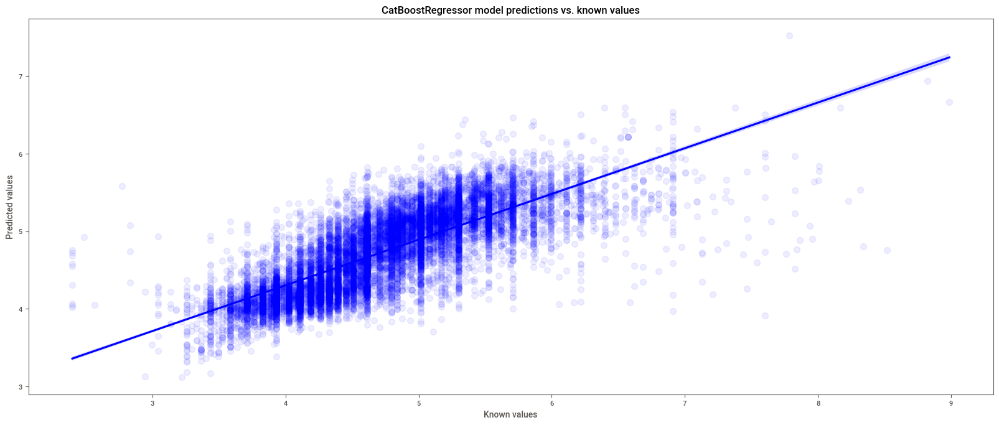

In [74]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, predictions_test_cb, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('CatBoostRegressor model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

In [75]:
# feature_importance analysis
feature_importance_cb = pd.DataFrame({'feature_importance':model_cb.feature_importances_,\
                                   'feature_name': X_test.dtype.names}).sort_values(by=['feature_importance'],
                                    ascending=False)
#feature_importance_cb.to_csv(index=False)
feature_importance_cb

,feature_importance,feature_name
2,44.818288,None
1,14.490795,None
0,12.758705,None
7,8.377604,None
3,6.710202,None
6,4.731957,None
4,4.474599,None
5,3.637850,None


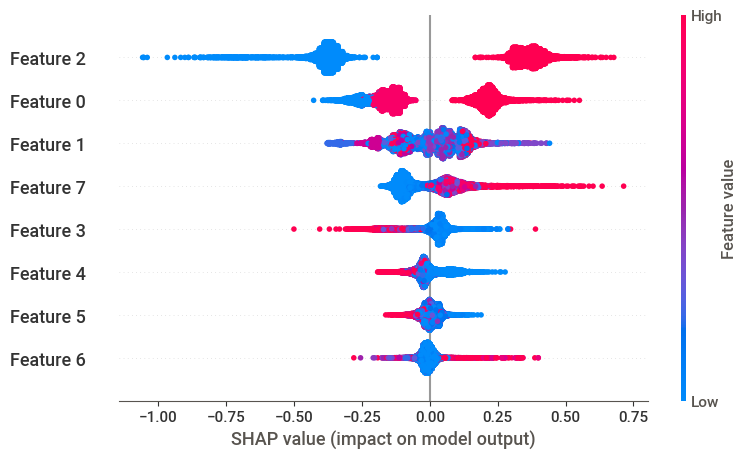

In [76]:
import shap
explainer = shap.TreeExplainer(model_cb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

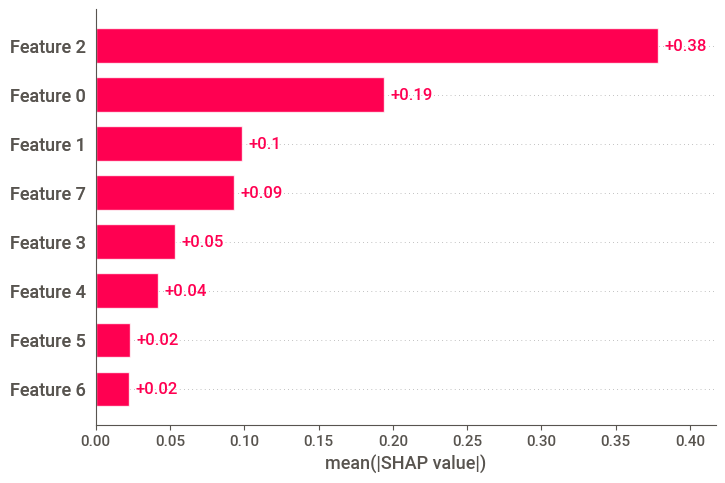

In [77]:
explainer = shap.Explainer(model_cb)
shap_values = explainer(X_test)
shap_importance = shap_values.abs.mean(0).values
sorted_idx = shap_importance.argsort()
#fig = plt.figure(figsize=(12, 6))
#plt.barh(range(len(sorted_idx)), shap_importance[sorted_idx], align='center')
#plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
#plt.title('SHAP Importance')
shap.plots.bar(shap_values, max_display=X_test.shape[0])

#### Построение и тренировка модели Линейной регрессии

In [78]:
# Построим и обучим модель LR
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [79]:
y_train_pred_lr = lr.predict(X_train)
y_pred_lr = lr.predict(X_test)
print("Test MSE LinearRegression = %.4f" % mean_squared_error(y_test, y_pred_lr))
print("Train MSE LinearRegression = %.4f" % mean_squared_error(y_train, y_train_pred_lr))
rmse_lr_test = np.sqrt(mean_squared_error(y_test, y_pred_lr))
print("Test RMSE LinearRegression: {:.2f}".format(rmse_lr_test))
print("Test R2 score LinearRegression: {:.2f}".format(r2_score(y_test,y_pred_lr)))
result.loc['LinearRegression','MSE'] = mean_squared_error(y_test, y_pred_lr).round(2)
result.loc['LinearRegression','RMSE'] = rmse_lr_test.round(2)
result.loc['LinearRegression','R2'] = r2_score(y_test,y_pred_lr).round(2)

Test MSE LinearRegression = 0.3574
Train MSE LinearRegression = 0.3617
Test RMSE LinearRegression: 0.60
Test R2 score LinearRegression: 0.24


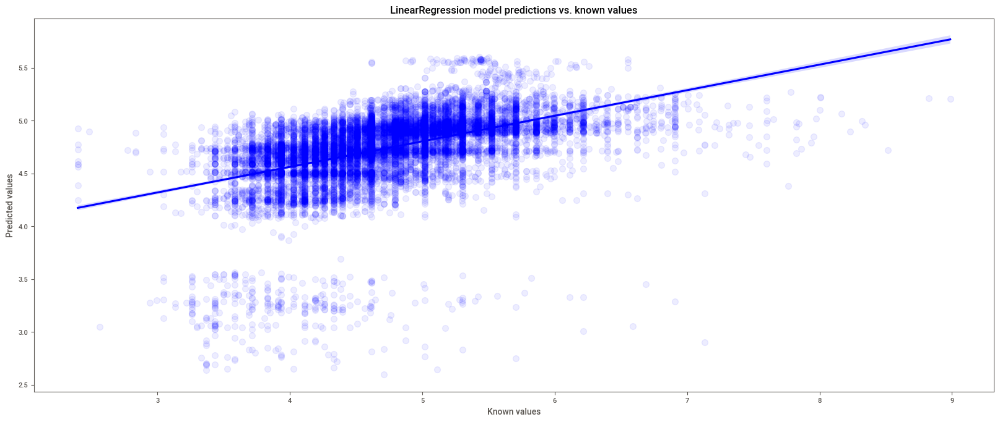

In [80]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, y_pred_lr, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('LinearRegression model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

#### Building and training the RidgeRegression model

In [81]:
from sklearn.linear_model import Ridge

model = Ridge(alpha = 100)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

print("Test MSE RidgeRegression = %.2f" % mean_squared_error(y_test, y_pred))
print("Train MSE RidgeRegression = %.2f" % mean_squared_error(y_train, y_train_pred))
rmse_ridge_test = np.sqrt(mean_squared_error(y_test, y_pred))
print("Test RMSE RidgeRegression: {:.2f}".format(rmse_ridge_test))
print("Test R2 score RidgeRegression: {:.2f}".format(r2_score(y_test,y_pred)))
result.loc['RidgeRegression','MSE'] = mean_squared_error(y_test, y_pred).round(2)
result.loc['RidgeRegression','RMSE'] = rmse_ridge_test.round(2)
result.loc['RidgeRegression','R2'] = r2_score(y_test,y_pred).round(2)

Test MSE RidgeRegression = 0.36
Train MSE RidgeRegression = 0.36
Test RMSE RidgeRegression: 0.60
Test R2 score RidgeRegression: 0.24


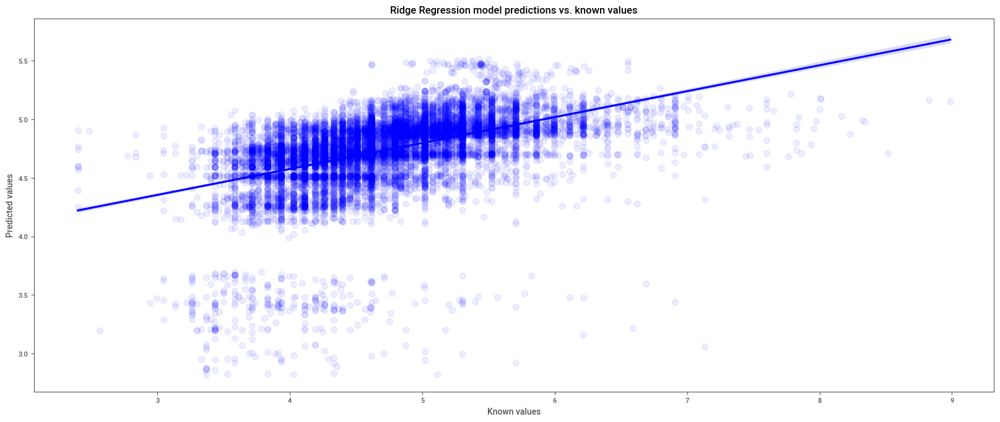

In [82]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, y_pred, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('Ridge Regression model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

#### Building and training the LassoRegression model

In [83]:
from sklearn.linear_model import Lasso

model1 = Lasso(alpha = 10)
model1.fit(X_train, y_train)
y_pred1 = model1.predict(X_test)
y_train_pred1 = model1.predict(X_train)

print("Test MSE LassoRegression = %.2f" % mean_squared_error(y_test, y_pred1))
print("Train MSE LassoRegression = %.2f" % mean_squared_error(y_train, y_train_pred1))
rmse_lasso_test = np.sqrt(mean_squared_error(y_test, y_pred1))
print("Test RMSE LassoRegression: {:.2f}".format(rmse_lasso_test))
print("Test R2 score LassoRegression: {:.2f}".format(r2_score(y_test,y_pred1)))
result.loc['LassoRegression','MSE'] = mean_squared_error(y_test, y_pred1).round(2)
result.loc['LassoRegression','RMSE'] = rmse_lasso_test.round(2)
result.loc['LassoRegression','R2'] = r2_score(y_test,y_pred1).round(2)

Test MSE LassoRegression = 0.47
Train MSE LassoRegression = 0.48
Test RMSE LassoRegression: 0.69
Test R2 score LassoRegression: -0.00


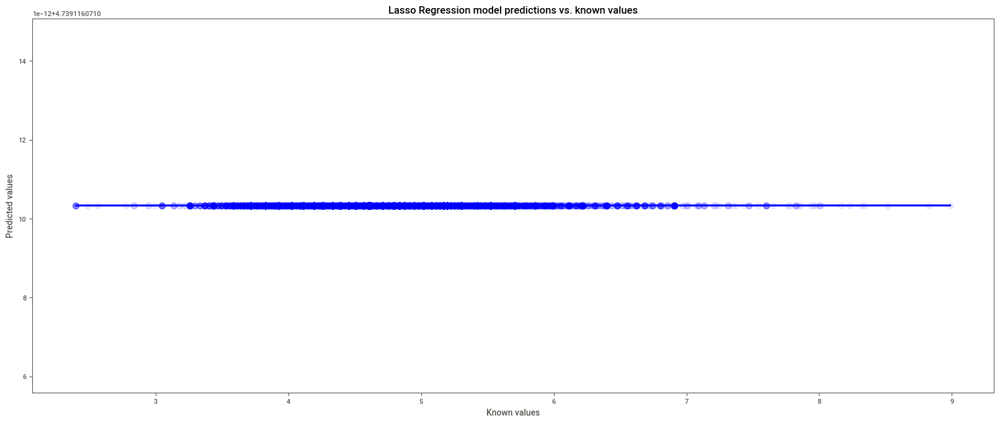

In [84]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, y_pred1, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('Lasso Regression model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

#### Building and training the ElasticNetRegression model

In [85]:
from sklearn.linear_model import ElasticNet
model2 = ElasticNet(alpha = 0.5,  l1_ratio= 0.5)
model2.fit(X_train, y_train)
y_pred2 = model2.predict(X_test)
y_train_pred2 = model2.predict(X_train)

print("Test MSE ElasticNet Regression = %.2f" % mean_squared_error(y_test, y_pred2))
print("Train MSE ElasticNet Regression = %.2f" % mean_squared_error(y_train, y_train_pred2))
rmse_elastic_test = np.sqrt(mean_squared_error(y_test, y_pred2))
print("Test RMSE ElasticNet Regression: {:.2f}".format(rmse_elastic_test))
print("Test R2 score ElasticNet Regression: {:.2f}".format(r2_score(y_test,y_pred2)))
result.loc['ElasticNet Regression','MSE'] = mean_squared_error(y_test, y_pred2).round(2)
result.loc['ElasticNet Regression','RMSE'] = rmse_elastic_test.round(2)
result.loc['ElasticNet Regression','R2'] = r2_score(y_test,y_pred2).round(2)

Test MSE ElasticNet Regression = 0.47
Train MSE ElasticNet Regression = 0.48
Test RMSE ElasticNet Regression: 0.69
Test R2 score ElasticNet Regression: -0.00


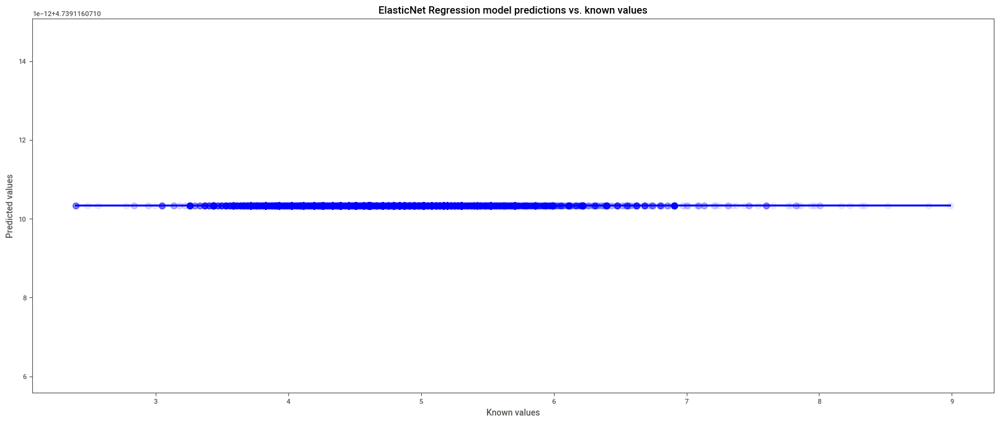

In [86]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, y_pred2, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('ElasticNet Regression model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

#### Building and training the LGBMRegressor model

In [87]:
#!pip install lightgbm
import lightgbm as lgb

In [88]:
# let's find the best hyperparameters for the model LGBMRegressor 

#model_lgb = lgb.LGBMRegressor(objective = 'root_mean_squared_error', random_state=42)
#parameters = {'depth'         : [4,6,8],
#              'learning_rate' : [0.01, 0.05, 0.1],
#              'n_estimators'    : [30, 50, 100]
#             }
#grid = GridSearchCV(estimator=model_lgb, param_grid = parameters, cv = 3, n_jobs=-1, verbose =100)
#grid.fit(X_train, y_train)
#print(" Results from Grid Search " )
##print(score)
#print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
#print("\n The best score across ALL searched params:\n", grid.best_score_)
#print("\n The best parameters across ALL searched params:\n", grid.best_params_)

#Results from Grid Search

#The best estimator across ALL searched params:
# LGBMRegressor(depth=4, objective='root_mean_squared_error', random_state=42)

# The best score across ALL searched params:
# 0.589592085830288

# The best parameters across ALL searched params:
# {'depth': 4, 'learning_rate': 0.1, 'n_estimators': 100}

In [89]:
model_lgb = lgb.LGBMRegressor(objective = 'root_mean_squared_error', depth= 4,\
                              learning_rate=0.1, n_estimators=100, n_jobs=-1, random_state=42)
model_lgb.fit(X_train, y_train)

[LightGBM] [Warning] Unknown parameter: depth


LGBMRegressor(depth=4, objective='root_mean_squared_error', random_state=42)

In [90]:
y_train_pred_lgb = model_lgb.predict(X_train)
predictions_test_lgb = model_lgb.predict(X_test)
rmse_lgb_test = np.sqrt(mean_squared_error(y_test, predictions_test_lgb))
print("Train MSE LGBMRegressor= %.2f" % mean_squared_error(y_train, y_train_pred_lgb))
print("Test MSE LGBMRegressor = %.2f" % mean_squared_error(y_test, predictions_test_lgb))
print("Test RMSE LGBMRegressor: {:.2f}".format(rmse_lgb_test))
print("Test R2 score LGBMRegressor: {:.2f}".format(r2_score(y_test,predictions_test_lgb)))
result.loc['LGBMRegressor','MSE'] = mean_squared_error(y_test, predictions_test_lgb).round(2)
result.loc['LGBMRegressor','RMSE'] = rmse_lgb_test.round(2)
result.loc['LGBMRegressor','R2'] = r2_score(y_test,predictions_test_lgb).round(2)

Train MSE LGBMRegressor= 0.18
Test MSE LGBMRegressor = 0.19
Test RMSE LGBMRegressor: 0.44
Test R2 score LGBMRegressor: 0.59


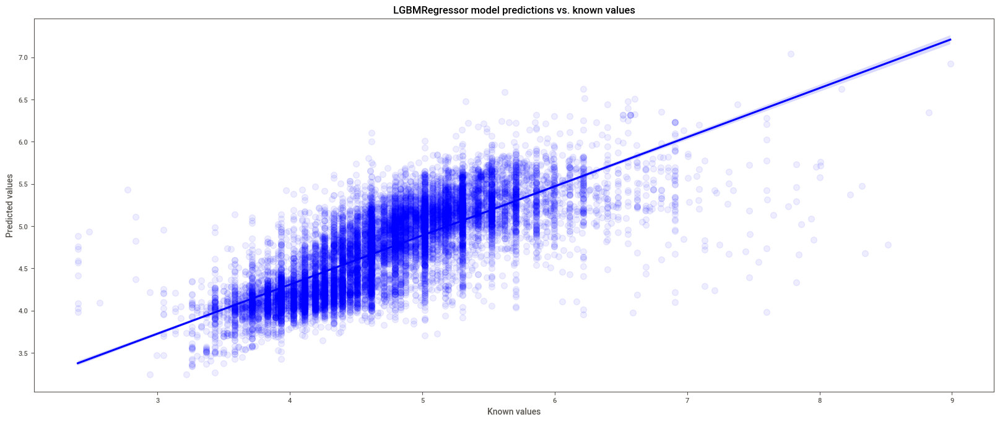

In [91]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, predictions_test_lgb, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('LGBMRegressor model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

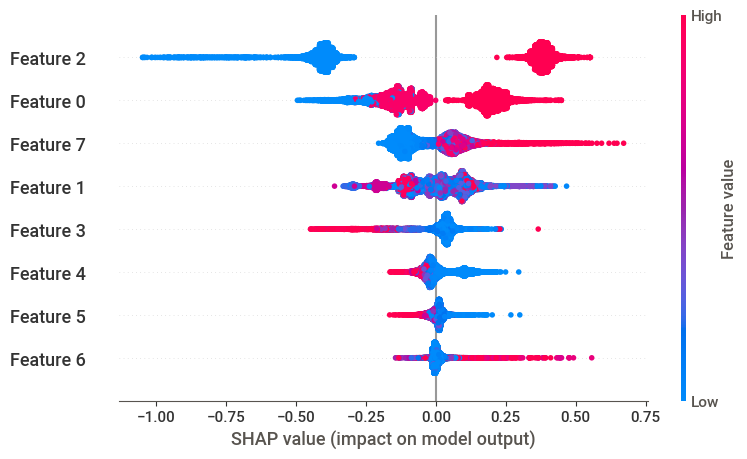

In [92]:
explainer = shap.TreeExplainer(model_lgb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

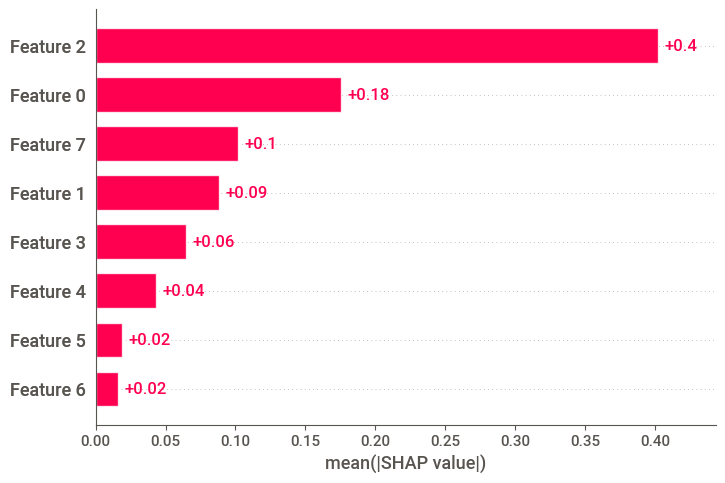

In [93]:
explainer = shap.Explainer(model_lgb)
shap_values = explainer(X_test)
shap_importance = shap_values.abs.mean(0).values
sorted_idx = shap_importance.argsort()
#fig = plt.figure(figsize=(12, 6))
#plt.barh(range(len(sorted_idx)), shap_importance[sorted_idx], align='center')
#plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
#plt.title('SHAP Importance')
shap.plots.bar(shap_values, max_display=X_test.shape[0])

In [94]:
result.sort_values(by='R2', ascending=False)

,MSE,RMSE,R2
CatBoostRegressor,0.19,0.44,0.6
LGBMRegressor,0.19,0.44,0.59
LinearRegression,0.36,0.6,0.24
RidgeRegression,0.36,0.6,0.24
DummyRegressor,0.47,0.69,-0.0
LassoRegression,0.47,0.69,-0.0
ElasticNet Regression,0.47,0.69,-0.0


- The CatBoostRegression model copes with the task a little better than other models, but is close to the result of LGBMRegressor
- Conventional regression models fail and produce high errors
- With such poor prediction results, I would not go to the 'business people'


<a id="model2"></a>
## 2. Building and training models - New strategy (Phase 2):

- Let's return to the original data and try to make a couple of transformations:
     - transform information about coordinates into the distance from the object to the center of Manhattan
     - remove the most prominent anomalies in the target feature
     - leave the logarithm of the target feature

In [95]:
df = df_init

In [96]:
df = df.drop(['id', 'name', 'host_name', 'last_review'], axis=1)
df.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [97]:
df['lat_long'] = list(zip(df['latitude'],df['longitude']))
df=df.drop(['longitude', 'latitude'], axis=1)

In [98]:
!pip install geopy
import geopy
from geopy.distance import geodesic
from geopy import distance


[notice] A new release of pip available: 22.3.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [99]:
df['center_coord'] = 0
df.insert(loc=1, column='lat_c', value=40.7529)
df.insert(loc=1, column='long_c', value=-73.9941)
df['center_coord'] = list(zip(df['lat_c'],df['long_c']))
df=df.drop(['long_c', 'lat_c'], axis=1)
df.head()

,host_id,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,lat_long,center_coord
0,2787,Brooklyn,Kensington,Private room,149,1,9,0.21,6,365,"(40.64749, -73.97237)","(40.7529, -73.9941)"
1,2845,Manhattan,Midtown,Entire home/apt,225,1,45,0.38,2,355,"(40.75362, -73.98377)","(40.7529, -73.9941)"
2,4632,Manhattan,Harlem,Private room,150,3,0,NaN,1,365,"(40.80902, -73.9419)","(40.7529, -73.9941)"
3,4869,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194,"(40.68514, -73.95976)","(40.7529, -73.9941)"
4,7192,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0,"(40.79851, -73.94399)","(40.7529, -73.9941)"


In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         48895 non-null  int64  
 1   neighbourhood_group             48895 non-null  object 
 2   neighbourhood                   48895 non-null  object 
 3   room_type                       48895 non-null  object 
 4   price                           48895 non-null  int64  
 5   minimum_nights                  48895 non-null  int64  
 6   number_of_reviews               48895 non-null  int64  
 7   reviews_per_month               38843 non-null  float64
 8   calculated_host_listings_count  48895 non-null  int64  
 9   availability_365                48895 non-null  int64  
 10  lat_long                        48895 non-null  object 
 11  center_coord                    48895 non-null  object 
dtypes: float64(1), int64(6), object(

In [101]:
df['distance']  = 0
df.head()

,host_id,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,lat_long,center_coord,distance
0,2787,Brooklyn,Kensington,Private room,149,1,9,0.21,6,365,"(40.64749, -73.97237)","(40.7529, -73.9941)",0
1,2845,Manhattan,Midtown,Entire home/apt,225,1,45,0.38,2,355,"(40.75362, -73.98377)","(40.7529, -73.9941)",0
2,4632,Manhattan,Harlem,Private room,150,3,0,NaN,1,365,"(40.80902, -73.9419)","(40.7529, -73.9941)",0
3,4869,Brooklyn,Clinton Hill,Entire home/apt,89,1,270,4.64,1,194,"(40.68514, -73.95976)","(40.7529, -73.9941)",0
4,7192,Manhattan,East Harlem,Entire home/apt,80,10,9,0.10,1,0,"(40.79851, -73.94399)","(40.7529, -73.9941)",0


In [102]:
def distancer(df):
    return geopy.distance.geodesic(df.lat_long, df.center_coord).km
df['distance'] = df.apply(distancer, axis=1)

In [103]:
df = df.drop(['lat_long', 'center_coord', 'host_id'], axis=1)

In [104]:
# remove objects with zero price (incorrect data)
#df = df[df.price != 0]
# reviews_per_month fill in the missing values (21%) with the median value
df['reviews_per_month'] = df['reviews_per_month'].fillna(df['reviews_per_month'].median())

In [105]:
# remove the most extreme outliers
q_low = df['price'].quantile(0.01)
q_high  = df['price'].quantile(0.99)
df = df[(df['price'] < q_high) & (df['price'] > q_low)]

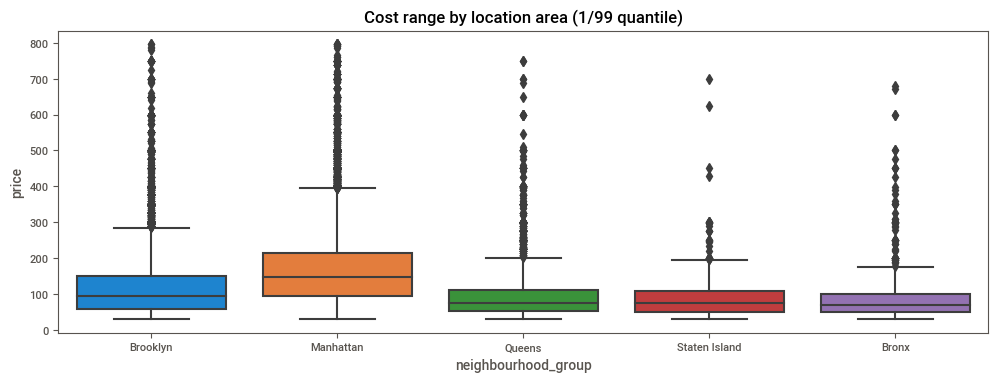

In [106]:
plt.figure(figsize = (12,4))
ax = sns.boxplot(x='neighbourhood_group', y="price", data=df)
plt.title('Cost range by location area (1/99 quantile)')
#ax.set_ylim([0, 1000])
plt.show()

Text(0.5, 1.0, 'Log of Price Density Distribution')

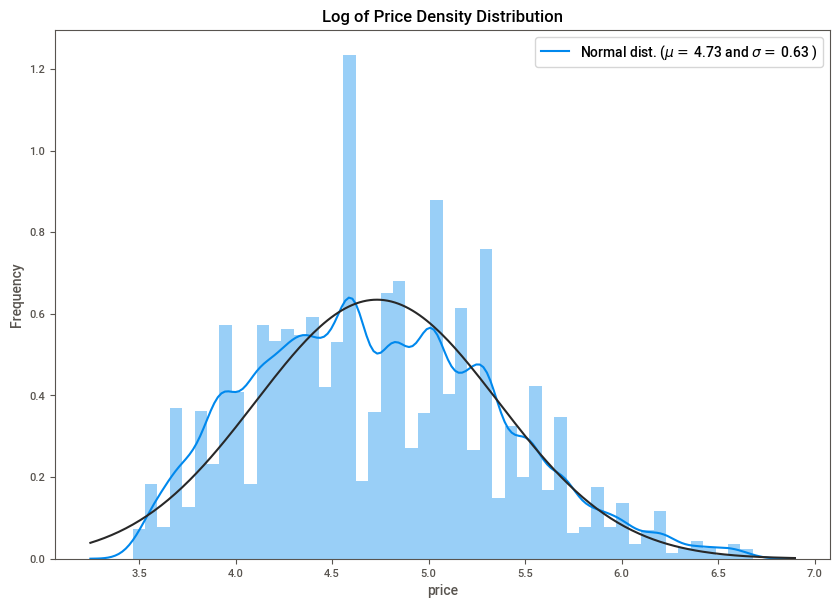

In [107]:
# Take the logarithm of the target feature
df['price'] = np.log1p(df.price)
plt.figure(figsize=(10,7))
sns.distplot(df.price, fit=norm)

# fit the distribution to the logarithm of the price
(mu, sigma) = norm.fit(df.price)

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')
plt.title('Log of Price Density Distribution')

In [108]:
# Define a function that encodes categorical features using the selected method.
def encode_func(df, enc, cols = ['neighbourhood_group','neighbourhood','room_type']):
    df_enc = df.copy()
    df_enc[cols]= enc.fit_transform(df_enc[cols])
    return df_enc

In [109]:
from category_encoders import CountEncoder
enc = CountEncoder()
df_enc = encode_func(df, enc)
df_enc.head()

,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,distance
0,19658,172,21856,5.010635,1,9,0.21,6,365,11.848774
1,21220,1492,24986,5.420535,1,45,0.38,2,355,0.876006
2,21220,2624,21856,5.017280,3,0,0.72,1,365,7.632510
3,19658,565,24986,4.499810,1,270,4.64,1,194,8.064652
4,21220,1107,24986,4.394449,10,9,0.10,1,0,6.599178


In [110]:
X = df_enc.drop('price', axis=1)
y = df_enc['price']

In [111]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42, shuffle=True)

In [112]:
# Standardization
#scaler = MinMaxScaler()
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train

array([[ 0.5349138 , -0.47858651,  0.55067519, ..., -0.18815073,
        -0.74847397, -0.73769283],
       [ 0.25888293,  1.71822543, -0.36514177, ..., -0.15862837,
        -0.44428388,  0.30830472],
       [ 0.25888293,  1.71822543,  0.55067519, ..., -0.18815073,
         0.14888681,  0.4488619 ],
       ...,
       [ 0.25888293,  0.72679395,  0.55067519, ..., -0.15862837,
        -0.81691674,  0.04268489],
       [ 0.5349138 ,  0.91167816, -0.36514177, ..., -0.12910601,
         1.43408995,  0.36018204],
       [-2.2444803 , -0.87903441, -0.36514177, ..., -0.12910601,
        -0.8549405 ,  0.36303751]])

In [113]:
# Create a new small dataframe with the final results
columns = ['MSE', 'RMSE', 'R2']
models = ['DummyRegressor', 'CatBoostRegressor', 'LGBMRegressor','RidgeRegression']
result2 = pd.DataFrame(columns=columns, index = models)
result2

,MSE,RMSE,R2
DummyRegressor,NaN,NaN,NaN
CatBoostRegressor,NaN,NaN,NaN
LGBMRegressor,NaN,NaN,NaN
RidgeRegression,NaN,NaN,NaN


#### Building and training the DummyRegressor model

In [114]:
# Check prediction of the model built using DummyClassifier
from sklearn.dummy import DummyRegressor

model_dr = DummyRegressor()
#strategy='median'
model_dr.fit(X_train, y_train)
y_train_pred_dr = model_dr.predict(X_train)
predictions_test_dr = model_dr.predict(X_test)
rmse_dr_test = np.sqrt(mean_squared_error(y_test, predictions_test_dr))
print("Test MSE DummyRegressor = %.2f" % mean_squared_error(y_test, predictions_test_dr))
print("Train MSE DummyRegressor = %.2f" % mean_squared_error(y_train, y_train_pred_dr))
print('Test RMSE DummyRegressor: {:.2f}'.format(rmse_dr_test))
print('Test R2 DummyRegressor: {:.2f}'.format(r2_score(y_test, predictions_test_dr)))
result2.loc['DummyRegressor','MSE'] = mean_squared_error(y_test, predictions_test_dr).round(2)
result2.loc['DummyRegressor','RMSE'] = rmse_dr_test.round(2)
result2.loc['DummyRegressor','R2'] = r2_score(y_test,predictions_test_dr).round(2)

Test MSE DummyRegressor = 0.39
Train MSE DummyRegressor = 0.40
Test RMSE DummyRegressor: 0.63
Test R2 DummyRegressor: -0.00


#### Building and training the CatBoostRegressor model

In [115]:
#model_cb = CatBoostRegressor(#one_hot_max_size=5,
#                             random_seed=42, verbose =100, loss_function= "RMSE"
#                             )
#parameters = {'depth'         : [6, 8,10],
#              'learning_rate' : [0.01, 0.05, 0.1],
#              'iterations'    : [50,100,120]
#             }
#grid = GridSearchCV(estimator=model_cb, param_grid = parameters, cv = 5,\
#                     n_jobs=-1, verbose=True)
#grid.fit(X_train, y_train)
#print(" Results from Grid Search " )
#print(score)
#print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
#print("\n The best score across ALL searched params:\n", grid.best_score_)
#print("\n The best parameters across ALL searched params:\n", grid.best_params_)

#The best estimator across ALL searched params:
# <catboost.core.CatBoostRegressor object at 0x0000026B4F5E8730>

# The best score across ALL searched params:
# 0.6338068928267043

# The best parameters across ALL searched params:
# {'depth': 10, 'iterations': 120, 'learning_rate': 0.1}

In [116]:
# CatBoost model:
model_cb = CatBoostRegressor(verbose=50, random_seed=42, iterations= 120,\
                             learning_rate = 0.1, depth=10, loss_function='RMSE')
model_cb.fit(X_train,y_train, eval_set=(X_test,y_test),\
              use_best_model=True, plot=True)
print(model_cb.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.5949057	test: 0.5918525	best: 0.5918525 (0)	total: 20.4ms	remaining: 2.43s
50:	learn: 0.3729003	test: 0.3815687	best: 0.3815687 (50)	total: 886ms	remaining: 1.2s
100:	learn: 0.3615546	test: 0.3773215	best: 0.3773215 (100)	total: 1.78s	remaining: 335ms
119:	learn: 0.3576134	test: 0.3762421	best: 0.3762421 (119)	total: 2.1s	remaining: 0us

bestTest = 0.3762421044
bestIteration = 119

{'learn': {'RMSE': 0.35761344108769555}, 'validation': {'RMSE': 0.37624210440013917}}


In [117]:
y_train_pred_cb = model_cb.predict(X_train)
predictions_test_cb = model_cb.predict(X_test)
rmse_cb_test = np.sqrt(mean_squared_error(y_test, predictions_test_cb))
print("Test MSE CatBoostRegressor = %.2f" % mean_squared_error(y_test, predictions_test_cb))
print("Train MSE CatBoostRegressor = %.2f" % mean_squared_error(y_train, y_train_pred_cb))
print("Test RMSE CatBoostRegressor: {:.2f}".format(rmse_cb_test))
print("Test R2 score: {:.2f}".format(r2_score(y_test,predictions_test_cb)))
result2.loc['CatBoostRegressor','MSE'] = mean_squared_error(y_test, predictions_test_cb).round(2)
result2.loc['CatBoostRegressor','RMSE'] = rmse_cb_test.round(2)
result2.loc['CatBoostRegressor','R2'] = r2_score(y_test,predictions_test_cb).round(2)

Test MSE CatBoostRegressor = 0.14
Train MSE CatBoostRegressor = 0.13
Test RMSE CatBoostRegressor: 0.38
Test R2 score: 0.64


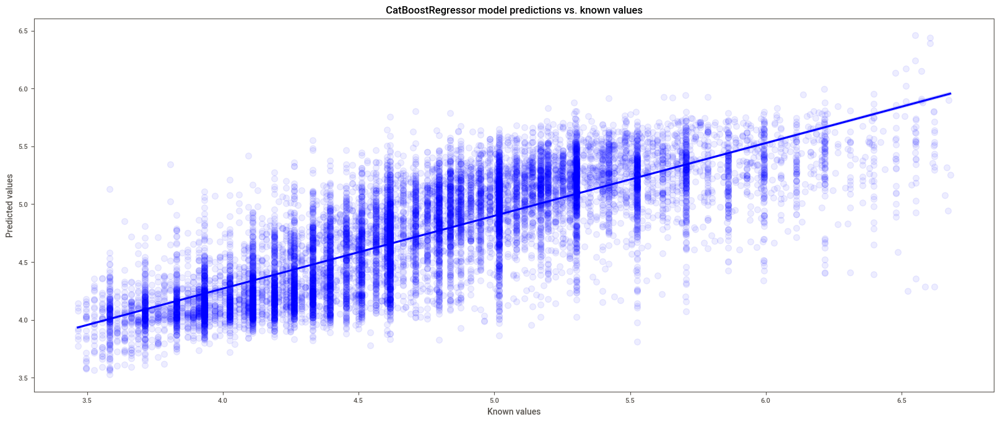

In [118]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, predictions_test_cb, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('CatBoostRegressor model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

In [119]:
# feature_importance analysis
feature_importance_cb = pd.DataFrame({'feature_importance':model_cb.feature_importances_,\
                                   'feature_name': X_test.dtype.names}).sort_values(by=['feature_importance'],
                                    ascending=False)
#feature_importance_cb.to_csv(index=False)
feature_importance_cb

,feature_importance,feature_name
2,52.270315,None
8,13.082172,None
7,7.962340,None
3,6.104366,None
1,4.894057,None
0,4.171533,None
4,3.973545,None
6,3.915077,None
5,3.626595,None


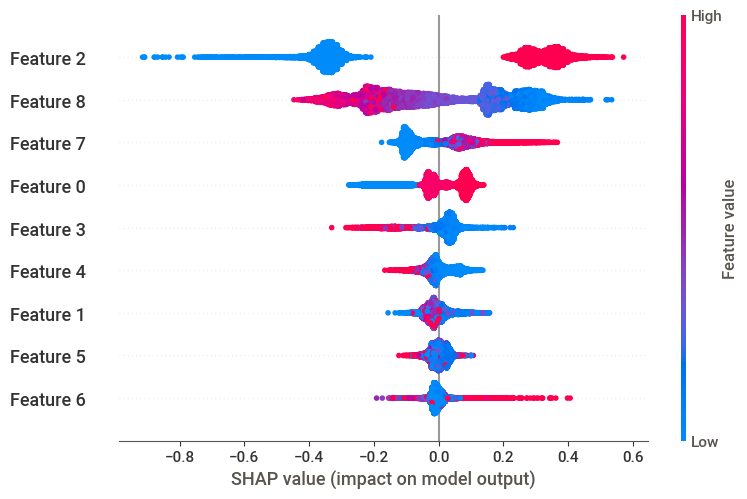

In [120]:
import shap
explainer = shap.TreeExplainer(model_cb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

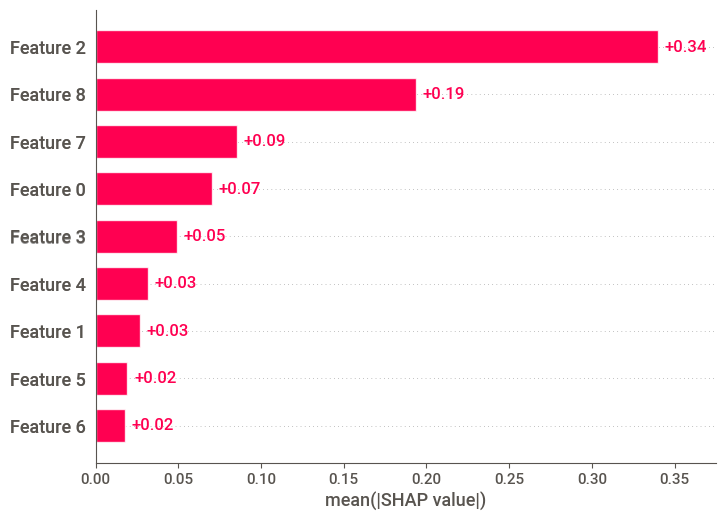

In [121]:
explainer = shap.Explainer(model_cb)
shap_values = explainer(X_test)
shap_importance = shap_values.abs.mean(0).values
sorted_idx = shap_importance.argsort()
#fig = plt.figure(figsize=(12, 6))
#plt.barh(range(len(sorted_idx)), shap_importance[sorted_idx], align='center')
#plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
#plt.title('SHAP Importance')
shap.plots.bar(shap_values, max_display=X_test.shape[0])

#### Building and training the LGBMRegressor model

In [122]:
#import lightgbm as lgb
#model_lgb = lgb.LGBMRegressor(objective = 'root_mean_squared_error', random_state=42)
#parameters = {'depth'         : [4,6,8],
#              'learning_rate' : [0.01, 0.05, 0.1],
#              'n_estimators'    : [30, 50, 100]
#             }
#grid = GridSearchCV(estimator=model_lgb, param_grid = parameters, cv = 3, n_jobs=-1, verbose =100)
#grid.fit(X_train, y_train)
#print(" Results from Grid Search " )
##print(score)
#print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
#print("\n The best score across ALL searched params:\n", grid.best_score_)
#print("\n The best parameters across ALL searched params:\n", grid.best_params_)

#Results from Grid Search

#The best estimator across ALL searched params:
# LGBMRegressor(depth=4, objective='root_mean_squared_error', random_state=42)

# The best score across ALL searched params:
# 0.6303700270945757

# The best parameters across ALL searched params:
# {'depth': 4, 'learning_rate': 0.1, 'n_estimators': 100}

In [123]:
model_lgb = lgb.LGBMRegressor(objective = 'root_mean_squared_error', depth= 4,\
                              learning_rate=0.1, n_estimators=100, n_jobs=-1, random_state=42)
model_lgb.fit(X_train, y_train)

[LightGBM] [Warning] Unknown parameter: depth


LGBMRegressor(depth=4, objective='root_mean_squared_error', random_state=42)

In [124]:
y_train_pred_lgb = model_lgb.predict(X_train)
predictions_test_lgb = model_lgb.predict(X_test)
rmse_lgb_test = np.sqrt(mean_squared_error(y_test, predictions_test_lgb))
print("Train MSE LGBMRegressor= %.2f" % mean_squared_error(y_train, y_train_pred_lgb))
print("Test MSE LGBMRegressor = %.2f" % mean_squared_error(y_test, predictions_test_lgb))
print("Test RMSE LGBMRegressor: {:.2f}".format(rmse_lgb_test))
print("Test R2 score LGBMRegressor: {:.2f}".format(r2_score(y_test,predictions_test_lgb)))
result2.loc['LGBMRegressor','MSE'] = mean_squared_error(y_test, predictions_test_lgb).round(2)
result2.loc['LGBMRegressor','RMSE'] = rmse_lgb_test.round(2)
result2.loc['LGBMRegressor','R2'] = r2_score(y_test,predictions_test_lgb).round(2)

Train MSE LGBMRegressor= 0.13
Test MSE LGBMRegressor = 0.14
Test RMSE LGBMRegressor: 0.38
Test R2 score LGBMRegressor: 0.64


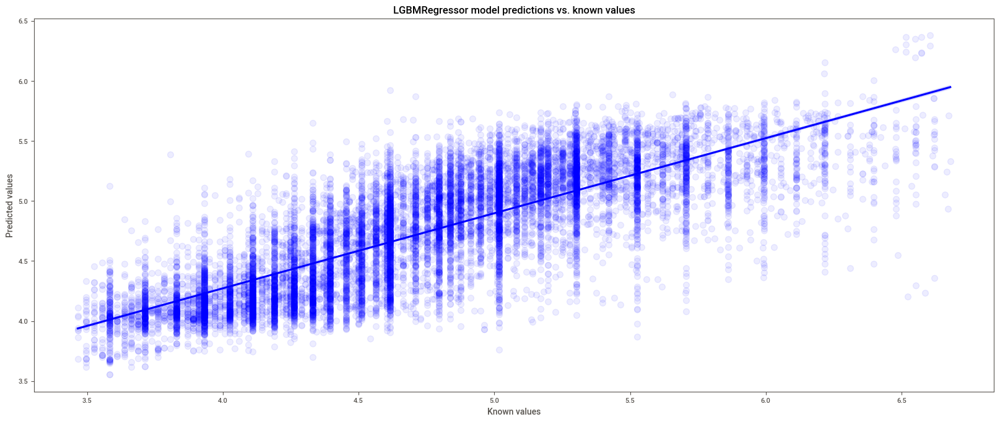

In [125]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, predictions_test_lgb, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('LGBMRegressor model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

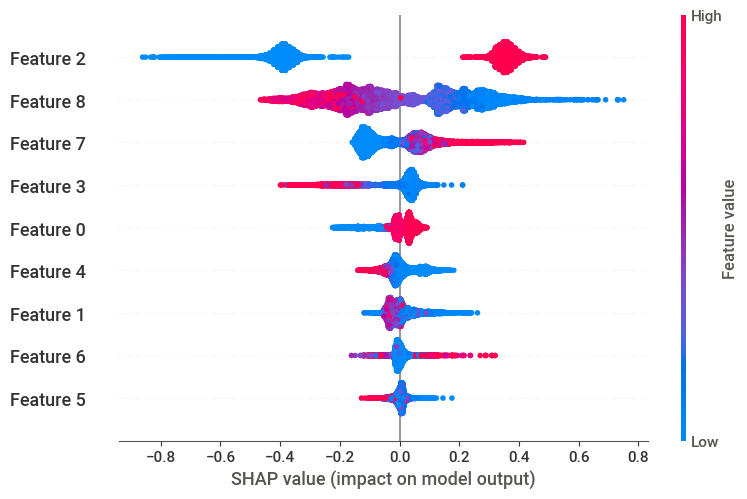

In [126]:
explainer = shap.TreeExplainer(model_lgb)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

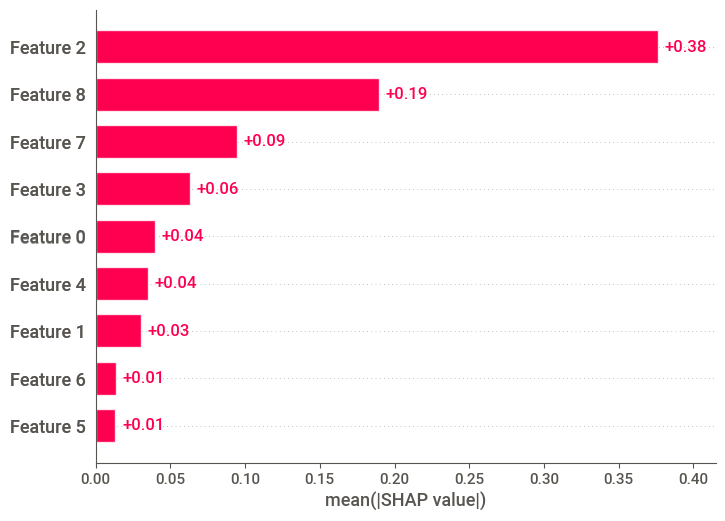

In [127]:
explainer = shap.Explainer(model_lgb)
shap_values = explainer(X_test)
shap_importance = shap_values.abs.mean(0).values
sorted_idx = shap_importance.argsort()
#fig = plt.figure(figsize=(12, 6))
#plt.barh(range(len(sorted_idx)), shap_importance[sorted_idx], align='center')
#plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
#plt.title('SHAP Importance')
shap.plots.bar(shap_values, max_display=X_test.shape[0])

#### Building and training the RidgeRegression model

In [128]:
model = Ridge(alpha = 100, solver= 'svd')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

print("Test MSE RidgeRegression = %.2f" % mean_squared_error(y_test, y_pred))
print("Train MSE RidgeRegression = %.2f" % mean_squared_error(y_train, y_train_pred))
rmse_ridge_test = np.sqrt(mean_squared_error(y_test, y_pred))
print("Test RMSE RidgeRegression: {:.2f}".format(rmse_ridge_test))
print("Test R2 score RidgeRegression: {:.2f}".format(r2_score(y_test,y_pred)))
result2.loc['RidgeRegression','MSE'] = mean_squared_error(y_test, y_pred).round(2)
result2.loc['RidgeRegression','RMSE'] = rmse_ridge_test.round(2)
result2.loc['RidgeRegression','R2'] = r2_score(y_test,y_pred).round(2)

Test MSE RidgeRegression = 0.26
Train MSE RidgeRegression = 0.26
Test RMSE RidgeRegression: 0.51
Test R2 score RidgeRegression: 0.33


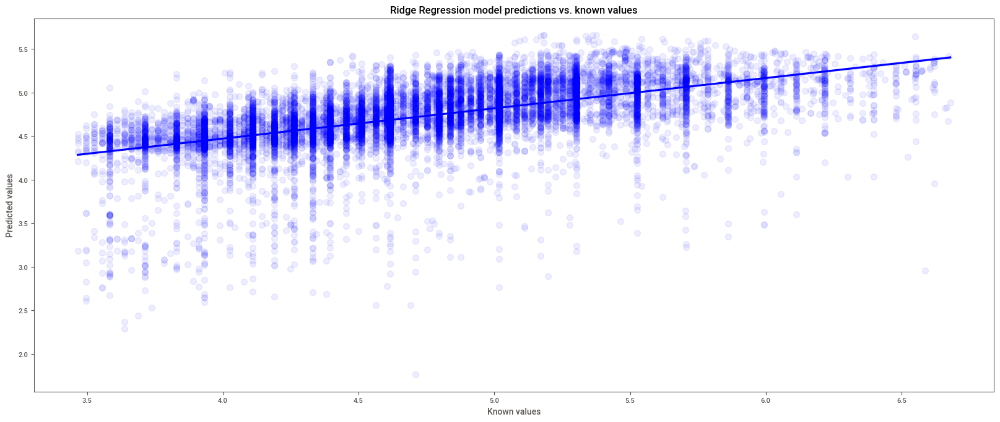

In [129]:
# Visualizing the model's prediction quality
plt.figure(figsize=(20,8))
sns.regplot(y_test, y_pred, color= 'b', fit_reg=True, scatter_kws={"s": 50, 'alpha':0.07})
plt.title('Ridge Regression model predictions vs. known values')
plt.xlabel('Known values')
plt.ylabel('Predicted values')
plt.show()

In [130]:
result2.sort_values(by='R2', ascending=False)

,MSE,RMSE,R2
CatBoostRegressor,0.14,0.38,0.64
LGBMRegressor,0.14,0.38,0.64
RidgeRegression,0.26,0.51,0.33
DummyRegressor,0.39,0.63,-0.0


#### Building and training the RidgeRegression model - with selected Alpha parameter

In [131]:
from sklearn.pipeline import Pipeline
alphas=np.linspace(1,stop=120)
pipe=Pipeline([('scaler',RobustScaler()), ('ridgemodel',RidgeCV(alphas=alphas,
                                                                cv=None,store_cv_values=True ))])
model=pipe.fit(X_train,y_train)
print('Alpha: %f'%model['ridgemodel'].alpha_)
print('Score: %f'%np.sqrt(-model['ridgemodel'].best_score_))

Alpha: 27.714286
Score: 0.508804


In [132]:
model = Ridge(alpha = 27.71, solver= 'svd')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

print("Test MSE RidgeRegression = %.2f" % mean_squared_error(y_test, y_pred))
print("Train MSE RidgeRegression = %.2f" % mean_squared_error(y_train, y_train_pred))
rmse_ridge_test = np.sqrt(mean_squared_error(y_test, y_pred))
print("Test RMSE RidgeRegression: {:.2f}".format(rmse_ridge_test))
print("Test R2 score RidgeRegression: {:.2f}".format(r2_score(y_test,y_pred)))
result2.loc['RidgeRegression','MSE'] = mean_squared_error(y_test, y_pred).round(2)
result2.loc['RidgeRegression','RMSE'] = rmse_ridge_test.round(2)
result2.loc['RidgeRegression','R2'] = r2_score(y_test,y_pred).round(2)

Test MSE RidgeRegression = 0.26
Train MSE RidgeRegression = 0.26
Test RMSE RidgeRegression: 0.51
Test R2 score RidgeRegression: 0.33


<a id="result"></a>
## 4. Final summary results - before and after data transformation:

In [133]:
# Phase 1
result.sort_values(by='R2', ascending=False)

,MSE,RMSE,R2
CatBoostRegressor,0.19,0.44,0.6
LGBMRegressor,0.19,0.44,0.59
LinearRegression,0.36,0.6,0.24
RidgeRegression,0.36,0.6,0.24
DummyRegressor,0.47,0.69,-0.0
LassoRegression,0.47,0.69,-0.0
ElasticNet Regression,0.47,0.69,-0.0


In [134]:
# Phase 2
result2.sort_values(by='R2', ascending=False)

,MSE,RMSE,R2
CatBoostRegressor,0.14,0.38,0.64
LGBMRegressor,0.14,0.38,0.64
RidgeRegression,0.26,0.51,0.33
DummyRegressor,0.39,0.63,-0.0


1. We can say that no actions helped to significantly improve the quality of the models. Tried:
     - remove unnecessary features/data
     - add new essential features
     - identify and remove extreme anomalies/outliers
     - smooth the target feature through logarithm
     - use slightly different encoders for categorical variables
     - use deep selection of parameters using GridSearch
     - data normalization through different normalizers
     - build completely different (algorithmically) models
     - conduct cross-validation when selecting model parameters
    
2. Phase 2 (the introduction of a new feature, distance from the center) had a strong impact on all models - this feature, according to the SHAP analysis of all models, came in 2nd place in terms of influence on the result

3. I confirm my conclusion, which was made based on the analysis of the map with the density of objects by price: I would do two different datasets and different analyzes in two dimensions:
      - rooms separate from apartments (at least)
      - Manhattan is separate from everything else
      - abnormally expensive (luxury) properties should also be analyzed as a separate market segment
4. All models, even with the manipulations performed, give a low quality of prediction (best R2score = 0.64)

5. I would also suggest obtaining more data for better modeling and determining the price - area of the object/property, floor, balcony, availability of equipment or furniture (for example, dishwasher/washing machine), amount of deposit, distance/close location to certain objects, etc.